# Computational Cognitive Neuroscience and AI

## Week 08 Convolutional Neural Network

## There are 5 questions and 3 coding exercises in this tutorial

## Zhixian Han <br> Department of Psychological Sciences <br> Purdue University

### Part of this tutorial is adapted from Neuromatch Academy Tutorials (CC-BY licensed) https://neuromatch.io/open-education-resources/

#**Please enable GPU in this notebook**

In [ ]:
# @title Set Up Code #1

# Imports
import os
import numpy as np
import torch
from torch import nn
from torch import optim
from matplotlib import pyplot as plt
import matplotlib as mpl

# Figure settings
import logging
logging.getLogger('matplotlib.font_manager').disabled = True

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/main/nma.mplstyle")



# Plotting Functions

def show_stimulus(img, ax=None, show=False):
  """Visualize a stimulus"""
  if ax is None:
    ax = plt.gca()
  ax.imshow(img+0.5, cmap=mpl.cm.binary)
  ax.set_xticks([])
  ax.set_yticks([])
  ax.spines['left'].set_visible(False)
  ax.spines['bottom'].set_visible(False)
  if show:
    plt.show()


def plot_weights(weights, channels=[0]):
  """ plot convolutional channel weights
  Args:
      weights: weights of convolutional filters (conv_channels x K x K)
      channels: which conv channels to plot
  """
  wmax = torch.abs(weights).max()
  fig, axs = plt.subplots(1, len(channels), figsize=(12, 2.5))
  for i, channel in enumerate(channels):
    im = axs[i].imshow(weights[channel, 0], vmin=-wmax, vmax=wmax, cmap='bwr')
    axs[i].set_title(f'channel {channel}')

    cb_ax = fig.add_axes([1, 0.1, 0.05, 0.8])
    plt.colorbar(im, ax=cb_ax)
    cb_ax.axis('off')
  plt.show()


def plot_example_activations(stimuli, act, channels=[0]):
  """ plot activations act and corresponding stimulus
  Args:
    stimuli: stimulus input to convolutional layer (n x h x w) or (h x w)
    act: activations of convolutional layer (n_bins x conv_channels x n_bins)
    channels: which conv channels to plot
  """
  if stimuli.ndim>2:
    n_stimuli = stimuli.shape[0]
  else:
    stimuli = stimuli.unsqueeze(0)
    n_stimuli = 1

  fig, axs = plt.subplots(n_stimuli, 1 + len(channels), figsize=(12, 12))

  # plot stimulus
  for i in range(n_stimuli):
    show_stimulus(stimuli[i].squeeze(), ax=axs[i, 0])
    axs[i, 0].set_title('stimulus')

    # plot example activations
    for k, (channel, ax) in enumerate(zip(channels, axs[i][1:])):
      im = ax.imshow(act[i, channel], vmin=-3, vmax=3, cmap='bwr')
      ax.set_xlabel('x-pos')
      ax.set_ylabel('y-pos')
      ax.set_title(f'channel {channel}')

    cb_ax = fig.add_axes([1.05, 0.8, 0.01, 0.1])
    plt.colorbar(im, cax=cb_ax)
    cb_ax.set_title('activation\n strength')
  plt.show()




# Helper Functions

def load_data_split(data_name):
  """Load mouse V1 data from Stringer et al. (2019)

  Data from study reported in this preprint:
  https://www.biorxiv.org/content/10.1101/679324v2.abstract

  These data comprise time-averaged responses of ~20,000 neurons
  to ~4,000 stimulus gratings of different orientations, recorded
  through Calcium imaginge. The responses have been normalized by
  spontaneous levels of activity and then z-scored over stimuli, so
  expect negative numbers. The repsonses were split into train and
  test and then each set were averaged in bins of 6 degrees.

  This function returns the relevant data (neural responses and
  stimulus orientations) in a torch.Tensor of data type torch.float32
  in order to match the default data type for nn.Parameters in
  Google Colab.

  It will hold out some of the trials when averaging to allow us to have test
  tuning curves.

  Args:
    data_name (str): filename to load

  Returns:
    resp_train (torch.Tensor): n_stimuli x n_neurons matrix of neural responses,
        each row contains the responses of each neuron to a given stimulus.
        As mentioned above, neural "response" is actually an average over
        responses to stimuli with similar angles falling within specified bins.
    resp_test (torch.Tensor): n_stimuli x n_neurons matrix of neural responses,
        each row contains the responses of each neuron to a given stimulus.
        As mentioned above, neural "response" is actually an average over
        responses to stimuli with similar angles falling within specified bins
    stimuli: (torch.Tensor): n_stimuli x 1 column vector with orientation
        of each stimulus, in degrees. This is actually the mean orientation
        of all stimuli in each bin.

  """
  with np.load(data_name) as dobj:
    data = dict(**dobj)
  resp_train = data['resp_train']
  resp_test = data['resp_test']
  stimuli = data['stimuli']

  # Return as torch.Tensor
  resp_train_tensor = torch.tensor(resp_train, dtype=torch.float32)
  resp_test_tensor = torch.tensor(resp_test, dtype=torch.float32)
  stimuli_tensor = torch.tensor(stimuli, dtype=torch.float32)

  return resp_train_tensor, resp_test_tensor, stimuli_tensor


def filters(out_channels=6, K=7):
  """ make example filters, some center-surround and gabors
  Returns:
      filters: out_channels x K x K
  """
  grid = np.linspace(-K/2, K/2, K).astype(np.float32)
  xx,yy = np.meshgrid(grid, grid, indexing='ij')

  # create center-surround filters
  sigma = 1.1
  gaussian = np.exp(-(xx**2 + yy**2)**0.5/(2*sigma**2))
  wide_gaussian = np.exp(-(xx**2 + yy**2)**0.5/(2*(sigma*2)**2))
  center_surround = gaussian - 0.5 * wide_gaussian

  # create gabor filters
  thetas = np.linspace(0, 180, out_channels-2+1)[:-1] * np.pi/180
  gabors = np.zeros((len(thetas), K, K), np.float32)
  lam = 10
  phi = np.pi/2
  gaussian = np.exp(-(xx**2 + yy**2)**0.5/(2*(sigma*0.4)**2))
  for i,theta in enumerate(thetas):
    x = xx*np.cos(theta) + yy*np.sin(theta)
    gabors[i] = gaussian * np.cos(2*np.pi*x/lam + phi)

  filters = np.concatenate((center_surround[np.newaxis,:,:],
                            -1*center_surround[np.newaxis,:,:],
                            gabors),
                           axis=0)
  filters /= np.abs(filters).max(axis=(1,2))[:,np.newaxis,np.newaxis]
  filters -= filters.mean(axis=(1,2))[:,np.newaxis,np.newaxis]
  # convert to torch
  filters = torch.from_numpy(filters)
  # add channel axis
  filters = filters.unsqueeze(1)

  return filters


def grating(angle, sf=1 / 28, res=0.1, patch=False):
  """Generate oriented grating stimulus

  Args:
    angle (float): orientation of grating (angle from vertical), in degrees
    sf (float): controls spatial frequency of the grating
    res (float): resolution of image. Smaller values will make the image
      smaller in terms of pixels. res=1.0 corresponds to 640 x 480 pixels.
    patch (boolean): set to True to make the grating a localized
      patch on the left side of the image. If False, then the
      grating occupies the full image.

  Returns:
    torch.Tensor: (res * 480) x (res * 640) pixel oriented grating image

  """

  angle = np.deg2rad(angle)  # transform to radians

  wpix, hpix = 640, 480  # width and height of image in pixels for res=1.0

  xx, yy = np.meshgrid(sf * np.arange(0, wpix * res) / res, sf * np.arange(0, hpix * res) / res)

  if patch:
    gratings = np.cos(xx * np.cos(angle + .1) + yy * np.sin(angle + .1))  # phase shift to make it better fit within patch
    gratings[gratings < 0] = 0
    gratings[gratings > 0] = 1
    xcent = gratings.shape[1] * .75
    ycent = gratings.shape[0] / 2
    xxc, yyc = np.meshgrid(np.arange(0, gratings.shape[1]), np.arange(0, gratings.shape[0]))
    icirc = ((xxc - xcent) ** 2 + (yyc - ycent) ** 2) ** 0.5 < wpix / 3 / 2 * res
    gratings[~icirc] = 0.5

  else:
    gratings = np.cos(xx * np.cos(angle) + yy * np.sin(angle))
    gratings[gratings < 0] = 0
    gratings[gratings > 0] = 1

  gratings -= 0.5

  # Return torch tensor
  return torch.tensor(gratings, dtype=torch.float32)


# Data retrieval and loading

import hashlib
import requests

fname = "W3D4_stringer_oribinned6_split.npz"
url = "https://osf.io/p3aeb/download"
expected_md5 = "b3f7245c6221234a676b71a1f43c3bb5"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    elif hashlib.md5(r.content).hexdigest() != expected_md5:
      print("!!! Data download appears corrupted !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)


In [ ]:
# @title Set Up Code #2

!pip install Pillow --quiet

# Imports
import time
import torch
import scipy.signal
import numpy as np
import matplotlib.pyplot as plt

import torch.nn as nn
import torch.nn.functional as F

import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader

from tqdm.notebook import tqdm, trange
from PIL import Image

# Figure Settings
import logging
logging.getLogger('matplotlib.font_manager').disabled = True

import ipywidgets as widgets  # Interactive display
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/content-creation/main/nma.mplstyle")






# Helper functions
from scipy.signal import correlate2d
import zipfile, gzip, shutil, tarfile


def download_data(fname, folder, url, tar):
  """
  Data downloading from OSF.

  Args:
    fname : str
      The name of the archive
    folder : str
      The name of the destination folder
    url : str
      The download url
    tar : boolean
      `tar=True` the archive is `fname`.tar.gz, `tar=False` is `fname`.zip

  Returns:
    Nothing.
  """

  if not os.path.exists(folder):
    print(f'\nDownloading {folder} dataset...')
    r = requests.get(url, allow_redirects=True)
    with open(fname, 'wb') as fh:
      fh.write(r.content)
    print(f'\nDownloading {folder} completed.')

    print('\nExtracting the files...\n')
    if not tar:
      with zipfile.ZipFile(fname, 'r') as fz:
        fz.extractall()
    else:
      with tarfile.open(fname) as ft:
        ft.extractall()
    # Remove the archive
    os.remove(fname)

    # Extract all .gz files
    foldername = folder + '/raw/'
    for filename in os.listdir(foldername):
      # Remove the extension
      fname = filename.replace('.gz', '')
      # Gunzip all files
      with gzip.open(foldername + filename, 'rb') as f_in:
        with open(foldername + fname, 'wb') as f_out:
          shutil.copyfileobj(f_in, f_out)
          os.remove(foldername+filename)
  else:
    print(f'{folder} dataset has already been downloaded.\n')


def check_shape_function(func, image_shape, kernel_shape):
  """
  Helper function to check shape implementation

  Args:
    func: f.__name__
      Function name
    image_shape: tuple
      Image shape
    kernel_shape: tuple
      Kernel shape

  Returns:
    Nothing
  """
  correct_shape = correlate2d(np.random.rand(*image_shape), np.random.rand(*kernel_shape), "valid").shape
  user_shape = func(image_shape, kernel_shape)
  if correct_shape != user_shape:
    print(f"❌ Your calculated output shape is not correct.")
  else:
    print(f"✅ Output for image_shape: {image_shape} and kernel_shape: {kernel_shape}, output_shape: {user_shape}, is correct.")


def check_conv_function(func, image, kernel):
  """
  Helper function to check conv_function

  Args:
    func: f.__name__
      Function name
    image: np.ndarray
      Image matrix
    kernel_shape: np.ndarray
      Kernel matrix

  Returns:
    Nothing
  """
  solution_user = func(image, kernel)
  solution_scipy = correlate2d(image, kernel, "valid")
  result_right = (solution_user == solution_scipy).all()
  if result_right:
    print("✅ The function calculated the convolution correctly.")
  else:
    print("❌ The function did not produce the right output.")
    print("For the input matrix:")
    print(image)
    print("and the kernel:")
    print(kernel)
    print("the function returned:")
    print(solution_user)
    print("the correct output would be:")
    print(solution_scipy)


def check_pooling_net(net, device='cpu'):
  """
  Helper function to check pooling output

  Args:
    net: nn.module
      Net instance
    device: string
      GPU/CUDA if available, CPU otherwise.

  Returns:
    Nothing
  """
  x_img = emnist_train[x_img_idx][0].unsqueeze(dim=0).to(device)
  output_x = net(x_img)
  output_x = output_x.squeeze(dim=0).detach().cpu().numpy()

  right_output = [
      [0.000000, 0.000000, 0.000000, 0.000000, 0.000000, 0.000000, 0.000000,
      0.000000, 0.000000, 0.000000, 0.000000, 0.000000],
      [0.000000, 0.000000, 0.000000, 0.000000, 0.000000, 0.000000, 0.000000,
      0.000000, 0.000000, 0.000000, 0.000000, 0.000000],
      [9.309552, 1.6216984, 0.000000, 0.000000, 0.000000, 0.000000, 2.2708383,
      2.6654134, 1.2271233, 0.000000, 0.000000, 0.000000],
      [12.873457, 13.318945, 9.46229, 4.663746, 0.000000, 0.000000, 1.8889914,
      0.31068993, 0.000000, 0.000000, 0.000000, 0.000000],
      [0.000000, 8.354934, 10.378724, 16.882853, 18.499334, 4.8546696, 0.000000,
      0.000000, 0.000000, 6.29296, 5.096506, 0.000000],
      [0.000000, 0.000000, 0.31068993, 5.7074604, 9.984148, 4.12916, 8.10037,
      7.667609, 0.000000, 0.000000, 1.2780352, 0.000000],
      [0.000000, 2.436305, 3.9764223, 0.000000, 0.000000, 0.000000, 12.98801,
      17.1756, 17.531992, 11.664275, 1.5453291, 0.000000],
      [4.2691708, 2.3217516, 0.000000, 0.000000, 1.3798618, 0.05612564, 0.000000,
      0.000000, 11.218788, 16.360992, 13.980816, 8.354935],
      [1.8126211, 0.000000, 0.000000, 2.9199777, 3.9382377, 0.000000, 0.000000,
      0.000000, 0.000000, 0.000000, 6.076582, 10.035061],
      [0.000000, 0.92164516, 4.434638, 0.7816348, 0.000000, 0.000000, 0.000000,
      0.000000, 0.000000, 0.000000, 0.000000, 0.83254766],
      [0.000000, 0.000000, 0.000000, 0.000000, 0.000000, 0.000000, 0.000000,
      0.000000, 0.000000, 0.000000, 0.000000, 0.000000],
      [0.000000, 0.000000, 0.000000, 0.000000, 0.000000, 0.000000, 0.000000,
      0.000000, 0.000000, 0.000000, 0.000000, 0.000000]
  ]

  right_shape = (3, 12, 12)

  if output_x.shape != right_shape:
    print(f"❌ Your output does not have the right dimensions. Your output is {output_x.shape} the expected output is {right_shape}")
  elif (output_x[0] != right_output).all():
    print("❌ Your output is not right.")
  else:
    print("✅ Your network produced the correct output.")


# Just returns accuracy on test data
def test(model, device, data_loader):
  """
  Test function

  Args:
    net: nn.module
      Net instance
    device: string
      GPU/CUDA if available, CPU otherwise.
    data_loader: torch.loader
      Test loader

  Returns:
    acc: float
      Test accuracy
  """
  model.eval()
  correct = 0
  total = 0
  for data in data_loader:
    inputs, labels = data
    inputs = inputs.to(device).float()
    labels = labels.to(device).long()

    outputs = model(inputs)
    _, predicted = torch.max(outputs, 1)
    total += labels.size(0)
    correct += (predicted == labels).sum().item()

  acc = 100 * correct / total
  return f"{acc}%"


# Plotting Functions

def display_image_from_greyscale_array(matrix, title):
  """
  Display image from greyscale array

  Args:
    matrix: np.ndarray
      Image
    title: string
      Title of plot

  Returns:
    Nothing
  """
  _matrix = matrix.astype(np.uint8)
  _img = Image.fromarray(_matrix, 'L')
  plt.figure(figsize=(3, 3))
  plt.imshow(_img, cmap='gray', vmin=0, vmax=255) # Using 220 instead of 255 so the examples show up better
  plt.title(title)
  plt.axis('off')


def make_plots(original, actual_convolution, solution):
  """
  Function to build original image/obtained solution and actual convolution

  Args:
    original: np.ndarray
      Image
    actual_convolution: np.ndarray
      Expected convolution output
    solution: np.ndarray
      Obtained convolution output

  Returns:
    Nothing
  """
  display_image_from_greyscale_array(original, "Original Image")
  display_image_from_greyscale_array(actual_convolution, "Convolution result")
  display_image_from_greyscale_array(solution, "Your solution")


def plot_loss_accuracy(train_loss, train_acc,
                       validation_loss, validation_acc):
  """
  Code to plot loss and accuracy

  Args:
    train_loss: list
      Log of training loss
    validation_loss: list
      Log of validation loss
    train_acc: list
      Log of training accuracy
    validation_acc: list
      Log of validation accuracy

  Returns:
    Nothing
  """
  epochs = len(train_loss)
  fig, (ax1, ax2) = plt.subplots(1, 2)
  ax1.plot(list(range(epochs)), train_loss, label='Training Loss')
  ax1.plot(list(range(epochs)), validation_loss, label='Validation Loss')
  ax1.set_xlabel('Epochs')
  ax1.set_ylabel('Loss')
  ax1.set_title('Epoch vs Loss')
  ax1.legend()

  ax2.plot(list(range(epochs)), train_acc, label='Training Accuracy')
  ax2.plot(list(range(epochs)), validation_acc, label='Validation Accuracy')
  ax2.set_xlabel('Epochs')
  ax2.set_ylabel('Accuracy')
  ax2.set_title('Epoch vs Accuracy')
  ax2.legend()
  fig.set_size_inches(15.5, 5.5)


# Set random seed

# Executing `set_seed(seed=seed)` you are setting the seed

# For DL its critical to set the random seed so that students can have a
# baseline to compare their results to expected results.
# Read more here: https://pytorch.org/docs/stable/notes/randomness.html

# Call `set_seed` function in the exercises to ensure reproducibility.
import random
import torch

def set_seed(seed=None, seed_torch=True):
  """
  Function that controls randomness.
  NumPy and random modules must be imported.

  Args:
    seed : Integer
      A non-negative integer that defines the random state. Default is `None`.
    seed_torch : Boolean
      If `True` sets the random seed for pytorch tensors, so pytorch module
      must be imported. Default is `True`.

  Returns:
    Nothing.
  """
  if seed is None:
    seed = np.random.choice(2 ** 32)
  random.seed(seed)
  np.random.seed(seed)
  if seed_torch:
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True

  print(f'Random seed {seed} has been set.')


# In case that `DataLoader` is used
def seed_worker(worker_id):
  """
  DataLoader will reseed workers following randomness in
  multi-process data loading algorithm.

  Args:
    worker_id: integer
      ID of subprocess to seed. 0 means that
      the data will be loaded in the main process
      Refer: https://pytorch.org/docs/stable/data.html#data-loading-randomness for more details

  Returns:
    Nothing
  """
  worker_seed = torch.initial_seed() % 2**32
  np.random.seed(worker_seed)
  random.seed(worker_seed)





# Set device (GPU or CPU). Execute `set_device()`
# especially if torch modules used.

# Inform the user if the notebook uses GPU or CPU.

def set_device():
  """
  Set the device. CUDA if available, CPU otherwise

  Args:
    None

  Returns:
    Nothing
  """
  device = "cuda" if torch.cuda.is_available() else "cpu"
  if device != "cuda":
    print("WARNING: For this notebook to perform best, "
        "if possible, in the menu under `Runtime` -> "
        "`Change runtime type.`  select `GPU` ")
  else:
    print("GPU is enabled in this notebook.")

  return device


In [ ]:

SEED = 0
set_seed(seed=SEED)
DEVICE = set_device()

Random seed 0 has been set.
GPU is enabled in this notebook.


In [ ]:
# @title Install dependencies

# @markdown **WARNING**: There may be *errors* and/or *warnings* reported during the installation. However, they should be ignored.

!pip install imageio --quiet
!pip install imageio-ffmpeg --quiet

In [ ]:
# @title Set Up Code #3

# Imports
import copy
import torch
import random
import pathlib

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torchvision import transforms
from torchvision.datasets import ImageFolder

from tqdm.auto import tqdm
from IPython.display import HTML, display

# Loading Animal Faces Data
import requests, os
from zipfile import ZipFile

print("Start downloading and unzipping `AnimalFaces` dataset...")
name = 'afhq'
fname = f"{name}.zip"
url = f"https://osf.io/kgfvj/download"

if not os.path.exists(fname):
  r = requests.get(url, allow_redirects=True)
  with open(fname, 'wb') as fh:
    fh.write(r.content)

  if os.path.exists(fname):
    with ZipFile(fname, 'r') as zfile:
      zfile.extractall(f".")
      os.remove(fname)

print("Download completed.")


# Loading Animal Faces Randomized data

print("Start downloading and unzipping `Randomized AnimalFaces` dataset...")

names = ['afhq_random_32x32', 'afhq_10_32x32']
urls = ["https://osf.io/9sj7p/download",
        "https://osf.io/wvgkq/download"]


for i, name in enumerate(names):
  url = urls[i]
  fname = f"{name}.zip"

  if not os.path.exists(fname):
    r = requests.get(url, allow_redirects=True)
    with open(fname, 'wb') as fh:
      fh.write(r.content)

    if os.path.exists(fname):
      with ZipFile(fname, 'r') as zfile:
        zfile.extractall(f".")
        os.remove(fname)

print("Download completed.")


# Plotting functions

def imshow(img):
  """
  Display unnormalized image

  Args:
    img: np.ndarray
      Datapoint to visualize

  Returns:
    Nothing
  """
  img = img / 2 + 0.5  # Unnormalize
  npimg = img.numpy()
  plt.imshow(np.transpose(npimg, (1, 2, 0)))
  plt.axis(False)
  plt.show()


def plot_weights(norm, labels, ws, title='Weight Size Measurement'):
  """
  Plot of weight size measurement [norm value vs layer]

  Args:
    norm: float
      Norm values
    labels: list
      Targets
    ws: list
      Weights
    title: string
      Title of plot

  Returns:
    Nothing
  """
  plt.figure(figsize=[8, 6])
  plt.title(title)
  plt.ylabel('Frobenius Norm Value')
  plt.xlabel('Model Layers')
  plt.bar(labels, ws)
  plt.axhline(y=norm,
              linewidth=1,
              color='r',
              ls='--',
              label='Total Model F-Norm')
  plt.legend()
  plt.show()


def visualize_data(dataloader):
  """
  Helper function to visualize data

  Args:
    dataloader: torch.tensor
      Dataloader to visualize

  Returns:
    Nothing
  """
  for idx, (data,label) in enumerate(dataloader):
    plt.figure(idx)
    # Choose the datapoint you would like to visualize
    index = 22

    # Choose that datapoint using index and permute the dimensions
    # and bring the pixel values between [0,1]
    data = data[index].permute(1, 2, 0) * \
           torch.tensor([0.5, 0.5, 0.5]) + \
           torch.tensor([0.5, 0.5, 0.5])

    # Convert the torch tensor into numpy
    data = data.numpy()

    plt.imshow(data)
    plt.axis(False)
    image_class = classes[label[index].item()]
    print(f'The image belongs to : {image_class}')

  plt.show()





# Helper functions

class AnimalNet(nn.Module):
  """
  Network Class - Animal Faces with following structure:
  nn.Linear(3 * 32 * 32, 128) # Fully connected layer 1
  nn.Linear(128, 32) # Fully connected layer 2
  nn.Linear(32, 3) # Fully connected layer 3
  """

  def __init__(self):
    """
    Initialize parameters of AnimalNet

    Args:
      None

    Returns:
      Nothing
    """
    super(AnimalNet, self).__init__()
    self.fc1 = nn.Linear(3 * 32 * 32, 128)
    self.fc2 = nn.Linear(128, 32)
    self.fc3 = nn.Linear(32, 3)

  def forward(self, x):
    """
    Forward Pass of AnimalNet

    Args:
      x: torch.tensor
        Input features

    Returns:
      output: torch.tensor
        Outputs/Predictions
    """
    x = x.view(x.shape[0], -1)
    x = F.relu(self.fc1(x))
    x = F.relu(self.fc2(x))
    x = self.fc3(x)
    output = F.log_softmax(x, dim=1)
    return output


class Net(nn.Module):
  """
  Network Class - 2D with following structure
  nn.Linear(1, 300) + leaky_relu(self.fc1(x)) # First fully connected layer
  nn.Linear(300, 500) + leaky_relu(self.fc2(x)) # Second fully connected layer
  nn.Linear(500, 1) # Final fully connected layer
  """

  def __init__(self):
    """
    Initialize parameters of Net

    Args:
      None

    Returns:
      Nothing
    """
    super(Net, self).__init__()

    self.fc1 = nn.Linear(1, 300)
    self.fc2 = nn.Linear(300, 500)
    self.fc3 = nn.Linear(500, 1)

  def forward(self, x):
    """
    Forward pass of Net

    Args:
      x: torch.tensor
        Input features

    Returns:
      x: torch.tensor
        Output/Predictions
    """
    x = F.leaky_relu(self.fc1(x))
    x = F.leaky_relu(self.fc2(x))
    output = self.fc3(x)
    return output


class BigAnimalNet(nn.Module):
  """
  Network Class - Animal Faces with following structure:
  nn.Linear(3*32*32, 124) + leaky_relu(self.fc1(x)) # First fully connected layer
  nn.Linear(124, 64) + leaky_relu(self.fc2(x)) # Second fully connected layer
  nn.Linear(64, 3) # Final fully connected layer
  """

  def __init__(self):
    """
    Initialize parameters for BigAnimalNet

    Args:
      None

    Returns:
      Nothing
    """
    super(BigAnimalNet, self).__init__()
    self.fc1 = nn.Linear(3*32*32, 124)
    self.fc2 = nn.Linear(124, 64)
    self.fc3 = nn.Linear(64, 3)

  def forward(self, x):
    """
    Forward pass of BigAnimalNet

    Args:
      x: torch.tensor
        Input features

    Returns:
      x: torch.tensor
        Output/Predictions
    """
    x = x.view(x.shape[0],-1)
    x = F.leaky_relu(self.fc1(x))
    x = F.leaky_relu(self.fc2(x))
    x = self.fc3(x)
    output = F.log_softmax(x, dim=1)
    return output


def train(args, model, train_loader, optimizer, epoch,
          reg_function1=None, reg_function2=None, criterion=F.nll_loss):
  """
  Trains the current input model using the data
  from Train_loader and Updates parameters for a single pass

  Args:
    args: dictionary
      Dictionary with epochs: 200, lr: 5e-3, momentum: 0.9, device: DEVICE
    model: nn.module
      Neural network instance
    train_loader: torch.loader
      Input dataset
    optimizer: function
      Optimizer
    reg_function1: function
      Regularisation function [default: None]
    reg_function2: function
      Regularisation function [default: None]
    criterion: function
      Specifies loss function [default: nll_loss]

  Returns:
    model: nn.module
      Neural network instance post training
  """
  device = args['device']
  model.train()
  for batch_idx, (data, target) in enumerate(train_loader):
    data, target = data.to(device), target.to(device)
    optimizer.zero_grad()
    output = model(data)
    # L1 regularization
    if reg_function2 is None and reg_function1 is not None:
      loss = criterion(output, target) + args['lambda1']*reg_function1(model)
    # L2 regularization
    elif reg_function1 is None and reg_function2 is not None:
      loss = criterion(output, target) + args['lambda2']*reg_function2(model)
    # No regularization
    elif reg_function1 is None and reg_function2 is None:
      loss = criterion(output, target)
    # Both L1 and L2 regularizations
    else:
      loss = criterion(output, target) + args['lambda1']*reg_function1(model) + args['lambda2']*reg_function2(model)
    loss.backward()
    optimizer.step()

  return model


def test(model, test_loader, loader='Test', criterion=F.nll_loss,
         device='cpu'):
  """
  Tests the current model

  Args:
    model: nn.module
      Neural network instance
    device: string
      GPU/CUDA if available, CPU otherwise
    test_loader: torch.loader
      Test dataset
    criterion: function
      Specifies loss function [default: nll_loss]

  Returns:
    test_loss: float
      Test loss
  """
  model.eval()
  test_loss = 0
  correct = 0
  with torch.no_grad():
    for data, target in test_loader:
      data, target = data.to(device), target.to(device)
      output = model(data)
      test_loss += criterion(output, target, reduction='sum').item()  # sum up batch loss
      pred = output.argmax(dim=1, keepdim=True)  # Get the index of the max log-probability
      correct += pred.eq(target.view_as(pred)).sum().item()

  test_loss /= len(test_loader.dataset)
  return 100. * correct / len(test_loader.dataset)


def main(args, model, train_loader, val_loader, test_data,
         reg_function1=None, reg_function2=None, criterion=F.nll_loss):
  """
  Trains the model with train_loader and
  tests the learned model using val_loader

  Args:
    args: dictionary
      Dictionary with epochs: 200, lr: 5e-3, momentum: 0.9, device: DEVICE
    model: nn.module
      Neural network instance
    train_loader: torch.loader
      Train dataset
    val_loader: torch.loader
      Validation set
    reg_function1: function
      Regularisation function [default: None]
    reg_function2: function
      Regularisation function [default: None]

  Returns:
    val_acc_list: list
      Log of validation accuracy
    train_acc_list: list
      Log of training accuracy
    param_norm_list: list
      Log of frobenius norm
    trained_model: nn.module
      Trained model/model post training
  """
  device = args['device']

  model = model.to(device)
  optimizer = optim.SGD(model.parameters(), lr=args['lr'], momentum=args['momentum'])

  val_acc_list, train_acc_list,param_norm_list = [], [], []
  for epoch in tqdm(range(args['epochs'])):
    trained_model = train(args, model, train_loader, optimizer, epoch,
                          reg_function1=reg_function1,
                          reg_function2=reg_function2)
    train_acc = test(trained_model, train_loader, loader='Train', device=device)
    val_acc = test(trained_model, val_loader, loader='Val', device=device)
    param_norm = calculate_frobenius_norm(trained_model)
    train_acc_list.append(train_acc)
    val_acc_list.append(val_acc)
    param_norm_list.append(param_norm)

  return val_acc_list, train_acc_list, param_norm_list, model


def calculate_frobenius_norm(model):
    """
    Function to calculate frobenius norm

    Args:
      model: nn.module
        Neural network instance

    Returns:
      norm: float
        Frobenius norm
    """
    norm = 0.0
    # Sum the square of all parameters
    for name,param in model.named_parameters():
        norm += torch.norm(param).data**2
    # Return a square root of the sum of squares of all the parameters
    return norm**0.5


def early_stopping_main(args, model, train_loader, val_loader, test_data):
  """
  Function to simulate early stopping

  Args:
    args: dictionary
      Dictionary with epochs: 200, lr: 5e-3, momentum: 0.9, device: DEVICE
    model: nn.module
      Neural network instance
    train_loader: torch.loader
      Train dataset
    val_loader: torch.loader
      Validation set

  Returns:
    val_acc_list: list
      Val accuracy log until early stop point
    train_acc_list: list
      Training accuracy log until early stop point
    best_model: nn.module
      Model performing best with early stopping
    best_epoch: int
      Epoch at which early stopping occurs
  """
  device = args['device']

  model = model.to(device)
  optimizer = optim.SGD(model.parameters(), lr=args['lr'], momentum=args['momentum'])

  best_acc  = 0.0
  best_epoch = 0

  # Number of successive epochs that you want to wait before stopping training process
  patience = 20

  # Keps track of number of epochs during which the val_acc was less than best_acc
  wait = 0

  val_acc_list, train_acc_list = [], []
  for epoch in tqdm(range(args['epochs'])):
    trained_model = train(args, model, device, train_loader, optimizer, epoch)
    train_acc = test(trained_model, train_loader, loader='Train', device=device)
    val_acc = test(trained_model, val_loader, loader='Val', device=device)
    if (val_acc > best_acc):
      best_acc = val_acc
      best_epoch = epoch
      best_model = copy.deepcopy(trained_model)
      wait = 0
    else:
      wait += 1
    if (wait > patience):
      print(f'Early stopped on epoch: {epoch}')
      break
    train_acc_list.append(train_acc)
    val_acc_list.append(val_acc)

  return val_acc_list, train_acc_list, best_model, best_epoch


# Dataloaders for the Dataset
## Dataloaders for the Dataset
batch_size = 128
classes = ('cat', 'dog', 'wild')

train_transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
     ])
data_path = pathlib.Path('.')/'afhq' # Using pathlib to be compatible with all OS's
img_dataset = ImageFolder(data_path/'train', transform=train_transform)


####################################################
g_seed = torch.Generator()
g_seed.manual_seed(SEED)


## Dataloaders for the  Original Dataset
img_train_data, img_val_data,_ = torch.utils.data.random_split(img_dataset,
                                                               [100, 100, 14430])

# Creating train_loader and Val_loader
train_loader = torch.utils.data.DataLoader(img_train_data,
                                           batch_size=batch_size,
                                           worker_init_fn=seed_worker,
                                           num_workers=2,
                                           generator=g_seed)
val_loader = torch.utils.data.DataLoader(img_val_data,
                                         batch_size=1000,
                                         num_workers=2,
                                         worker_init_fn=seed_worker,
                                         generator=g_seed)

# Creating test dataset
test_transform = transforms.Compose([
     transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
     ])
img_test_dataset = ImageFolder(data_path/'val', transform=test_transform)


####################################################

## Dataloaders for the  Random Dataset

# Splitting randomized data into training and validation data
data_path = pathlib.Path('.')/'afhq_random_32x32/afhq_random' # using pathlib to be compatible with all OS's
img_dataset = ImageFolder(data_path/'train', transform=train_transform)
random_img_train_data, random_img_val_data,_ = torch.utils.data.random_split(img_dataset, [100,100,14430])

# Randomized train and validation dataloader
rand_train_loader = torch.utils.data.DataLoader(random_img_train_data,
                                                batch_size=batch_size,
                                                num_workers=2,
                                                worker_init_fn=seed_worker,
                                                generator=g_seed)
rand_val_loader = torch.utils.data.DataLoader(random_img_val_data,
                                              batch_size=1000,
                                              num_workers=2,
                                              worker_init_fn=seed_worker,
                                              generator=g_seed)

####################################################

## Dataloaders for the Partially Random Dataset

# Splitting data between training and validation dataset for partially randomized data
data_path = pathlib.Path('.')/'afhq_10_32x32/afhq_10' # using pathlib to be compatible with all OS's
img_dataset = ImageFolder(data_path/'train', transform=train_transform)
partially_random_train_data, partially_random_val_data, _ = torch.utils.data.random_split(img_dataset, [100,100,14430])

# Training and Validation loader for partially randomized data
partial_rand_train_loader = torch.utils.data.DataLoader(partially_random_train_data,
                                                        batch_size=batch_size,
                                                        num_workers=2,
                                                        worker_init_fn=seed_worker,
                                                        generator=g_seed)
partial_rand_val_loader = torch.utils.data.DataLoader(partially_random_val_data,
                                                      batch_size=1000,
                                                      num_workers=2,
                                                      worker_init_fn=seed_worker,
                                                      generator=g_seed)



Start downloading and unzipping `AnimalFaces` dataset...
Download completed.
Start downloading and unzipping `Randomized AnimalFaces` dataset...
Download completed.


# Regularization, Parameter Sharing and the Neuroscience Study that Inspired CNN

A key idea of neural nets is that they use models that are “too complex” - complex enough to fit all the noise in the data. One then needs to “regularize” them to make the models fit complex enough, but not too complex. The more complex the model, the better it fits the training data, but if it is too complex, it generalizes less well; it memorizes the training data but is less accurate on future test data.

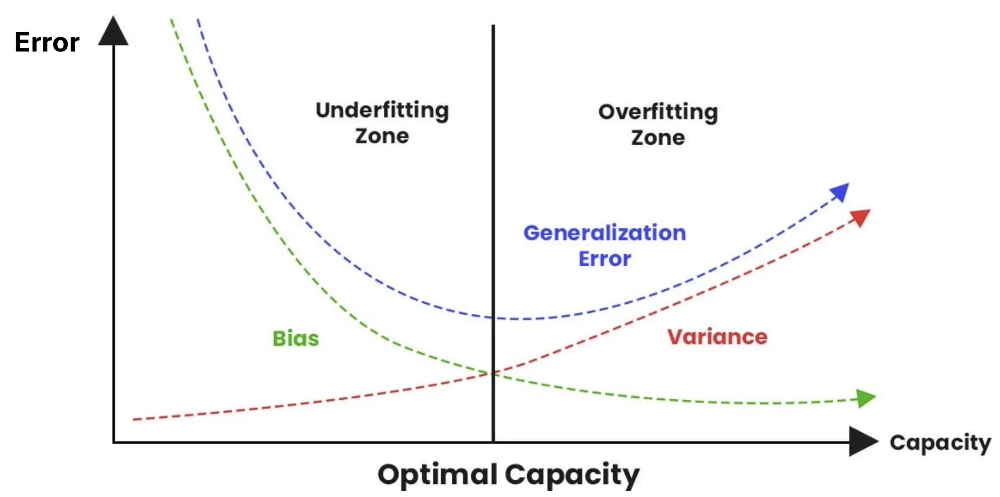

One way to think about Regularization is to think in terms of the magnitude of the overall weights of the model. A model with big weights can fit more data perfectly, whereas a model with smaller weights tends to underperform on the train set but can surprisingly do very well on the test set. Having the weights too small can also be an issue as it can then underfit the model.

## Parameter Sharing as a form of regularization

**Parameter sharing** is a technique in neural networks where the **same set of parameters (weights and biases) is used across multiple parts of the model** instead of having separate parameters for each unit. This **reduces the number of learnable parameters**, making the network more memory-efficient and faster.


**Why Use Parameter Sharing?**

1. **Reduces Memory Usage** → Fewer parameters to store.  
2. **Improves Generalization** → Helps prevent overfitting.  
3. **Speeds Up Training** → Fewer parameters to update.

**Can we use some kind of parameter sharing to reduce the number of parameters in the model?**


## Neuroscience Study That Inspired the Invention of Convolutional Neural Network

1. **The Neuroscience Study**

 **Hubel and Wiesel (1962)** studied the **visual cortex of cats**. They studied how neurons in the **primary visual cortex (V1)** respond to visual stimuli.

 **Reference**:  
 Hubel, D. H., & Wiesel, T. N. (1962). *Receptive fields, binocular interaction and functional architecture in the cat's visual cortex.* The Journal of Physiology, 160(1), 106-154.





In [ ]:

# @title Hubel & Wiesel's demonstration of simple, complex and hypercomplex cells in the cat's visual cortex
from ipywidgets import widgets
from IPython.display import YouTubeVideo
from IPython.display import IFrame
from IPython.display import display


class PlayVideo(IFrame):
  def __init__(self, id, source, page=1, width=400, height=300, **kwargs):
    self.id = id
    super(PlayVideo, self).__init__(src, width, height, **kwargs)


def display_videos(video_ids, W=400, H=300, fs=1):
  tab_contents = []
  for i, video_id in enumerate(video_ids):
    out = widgets.Output()
    with out:
      video = YouTubeVideo(id=video_ids[i][1], width=W,
                             height=H, fs=fs, rel=0)
      print(f'Video available at https://www.youtube.com/watch?v=jw6nBWo21Zk')
      display(video)
    tab_contents.append(out)
  return tab_contents


video_ids = [('Youtube', 'jw6nBWo21Zk')]
tab_contents = display_videos(video_ids, W=854, H=480)
tabs = widgets.Tab()
tabs.children = tab_contents
for i in range(len(tab_contents)):
  tabs.set_title(i, video_ids[i][0])
display(tabs)

The video above shows Hubel & Wiesel's Visual Cortex Experiment. This experiment involved inserting an **electrode** into the **visual cortex** (the brain region responsible for processing visual information) of a cat. The electrical signals generated by individual neurons were transmitted to a **speaker**, which produced a sound whenever a neuron was activated.

**How the Receptive Field Works**

The **light rod** serves as a stimulus, presented within the **receptive field** of a neuron—essentially the neuron's "visual area." A **receptive field** consists of:
- **Excitatory regions** → When the stimulus appears here, the neuron becomes active and sends a signal, causing the speaker to produce a sound.
- **Inhibitory regions** → When the stimulus enters this area, the neuron’s activity is suppressed, and no signal is sent.

**Types of Neurons Demonstrated in the Video**

The video shows three types of neurons, each with different response behaviors:

(1) **Simple Neurons**
- Have a **receptive field** with an **excitatory center** and **inhibitory surrounding regions**.
- The experimenter’s drawings represent these fields:
  - `"+"` → Excitatory region
  - **Triangle** → Inhibitory region

(2) **Complex Neurons**
- These neurons respond primarily to **specific movements and rotations** (represented by an arrow).
- **Insensitive to stimulus size**, meaning they respond the same way regardless of how big or small the stimulus is.
- Specialized for **motion detection**.
- They also do **not differentiate between light and dark stimuli**.

(3) **Hypercomplex Neurons**
- Detect both **motion and size**.
- If the rod becomes **too large**, the neuron **stops responding**.
- These neurons have specific **inhibitory areas** designed to recognize **borders and shapes**, playing a key role in **object boundary detection**.

**These results also suggest that there is a hierarchical architecture in the visual system.**

### **The invention of convlutional neural networks**

 The neuroscience study revealed the hierarchical processing of visual information in the brain. It directly influenced the development of Convolutional Neural Networks (CNNs). The way neurons detect edges, motion, and shapes inspired how CNN filters work today.  

 In 1980, the **first ever convolutional network called Neocognitron** was invented by Fukushima ([Paper](https://www.rctn.org/bruno/public/papers/Fukushima1980.pdf)). However, the backpropagation algorithm was not available yet and people trained Neocognitron in other ways. The performance was not that good.

 Yann LeCun, in the late 1980s and early 1990s, developed **convlutional neural networks** (**CNNs**, notably **LeNet-5**) based on the neuroscience study of the visual cortex and he trained it using backpropagation ([Paper](https://watermark.silverchair.com/neco.1989.1.4.541.pdf?token=AQECAHi208BE49Ooan9kkhW_Ercy7Dm3ZL_9Cf3qfKAc485ysgAAA14wggNaBgkqhkiG9w0BBwagggNLMIIDRwIBADCCA0AGCSqGSIb3DQEHATAeBglghkgBZQMEAS4wEQQMc0efmelU21bPc279AgEQgIIDET8KtIjqxKEa9wWlSgVMVwpy0Bs84m67CxMhmC7Y-eB76itIm7zM9owoqsHI59uDlbWV0XZDx95bx6RaM4dYMTndCttvLpgYLI6VELOLKLBcwlPcSN54S5TqQ2OkFRPSBqvyMa5-Q3SHVzTWfDpSnzt9C62EvCEDJzlOIQznOCMV_9kaveTutcFMtO1H0shSvIwArkp8qAQP_YYLCzKhCu1EGD_DBbvbZc5H1dT-3__S5Avfr8D9hHnjEIlfh9i1gKnjRxTva5vT6Jfcx3J3ebUJXvxcura_HME2L-gxuKj9LTbZUGe4-nuGJP-9aAxda0conNFO_68wdFnL1W_LjZkk_cmCfyeLKBvtx8ik4Myy-XaYni-v8oR3kgJOj84PZZJ3AIpmDRejI9Vu1CwJXtOWROLQRePJGqJa_GVTkvRZCdcrlwk25HzyB7WEDSHtapw-Qb48Jvjsjeg07eM4B27aR1GIBcu813fyCjhxOev6xgKjpnpIIzAMwxoIkibnRE_SghD_Pwc00z2w2x9C4rHOxwUJpa3iIXxOCb1NTFf-Nq2Eg1zr8BJngsOVKU2omvKtMP-S8_5cVpbKQM_sKI6VrEE-PHQFdbO6ZFXdbmhpUFUiFULBbDvWJ_OyYZo9yyiZkP2sXyJHWqfJ-XEDUP3ks4WOkBvmey3hESZZ9iSc7q5qIbj66dMLEcomNL4iLBe8b4cQq0okduJNTNWSq6IqAfvGogBjjYNvh4ZhxZw-KQemZO0oue6SAW-mIFyVpvvwBeoKdUZTqzYWGaJyyR1moXhN72VV4LOO0zVZl9MK0NvVOPE45vD5X0_UzzN4pEkQY2dbdISQipdtNlsViQGITkMSKO65d_DrN6eTqjKx_0GVW9EjblNYi8S73CGS9rlpX41it77T-DjvWb141jxb2N8LmIObESKssN_HR68zWEA5qOm5rgMKavCgQ32F0hm1mHM3Fc2DUZoo0TMRPSQBb-HvWLWewD9IH6GMYuX7MouSX87M5aaTkGf2JuZ1QCI1dZR3Y6IwhYQVTIqksQiG)). His CNN acheived higher performance and became more well-known.  




### **Connection Between Neuroscience & CNNs**
| **Visual Cortex (Biology)** | **CNNs (Artificial Model)** |
|-------------------|----------------------|
| **Simple Cells** detect edges/orientations | **Convolutional Filters** learn edges |
| **Complex Cells** detect patterns from simple cells | **Deeper Layers** detect textures, shapes |
| **Hierarchical Processing** from low-level to high-level features | **Deep Networks** progressively learn complex features |

**CNNs are an artificial approximation of how the brain processes images.**

# Introduction to Convolutional Neural Networks

CNN models are particularly [well-suited](https://www.nature.com/articles/nn.4244) to modeling the visual system for a number of reasons:

1. **Distributed computation**: like any other neural network, CNN's use distributed representations to compute -- much like the brain seems to do. Such models, therefore, provide us with a vocabulary with which to talk and think about such distributed representations. Because we know the exact function the model is built to perform (e.g., orientation discrimination), we can analyze its internal representations with respect to this function and begin to interpret why the representations look the way they do. Most importantly, we can then use these insights to analyze the structure of neural representations observed in recorded population activity. We can qualitatively and quantitatively compare the representations we see in the model and in a given population of real neurons to hopefully tease out the computations it performs.

2. **Hierarchical architecture**: like in any other deep learning architecture, each layer of a deep CNN comprises a non-linear transformation of the previous layer. Thus, there is a natural hierarchy whereby layers closer to the network output represent increasingly more abstract information about the input image. For example, in a network trained to do object recognition, the early layers might represent information about edges in the image, whereas later layers closer to the output might represent various object categories. This resembles the [hierarchical structure of the visual system](https://pubmed.ncbi.nlm.nih.gov/1822724/), where [lower-level areas](https://www.jneurosci.org/content/25/46/10577.short) (e.g., retina, V1) represent visual features of the sensory input and [higher-level areas](https://www.sciencedirect.com/science/article/pii/S089662731200092X) (e.g., V4, IT) represent properties of objects in the visual scene. We can then naturally use a single CNN to model multiple visual areas, using early CNN layers to model lower-level visual areas and late CNN layers to model higher-level visual areas.

  Relative to fully connected networks, CNN's, in fact, have further hierarchical structure built-in through the max pooling layers. Recall that each output of a convolution + pooling block is the result of processing a local patch of the inputs to that block. If we stack such blocks in a sequence, then the outputs of each block will be sensitive to increasingly larger regions of the initial raw input to the network: an output from the first block is sensitive to a single patch of these inputs, corresponding to its "receptive field"; an output from the second block is sensitive to a patch of outputs from the first block, which together are sensitive to a larger patch of raw inputs comprising the union of their receptive fields. Receptive fields thus get larger for deeper layers (see [here](http://colah.github.io/posts/2014-07-Conv-Nets-Modular/) for a nice visual depiction of this). This resembles primate visual systems, where neurons in higher-level visual areas respond to stimuli in wider regions of the visual field than neurons in lower-level visual areas.

3. **Convolutional layers**: through the weight sharing constraint, the outputs of each channel of a convolutional layer process different parts of the input image in exactly the same way. This architectural constraint effectively builds into the network the assumption that objects in the world typically look the same regardless of where they are in space. This is useful for modeling the visual system for two (largely separate) reasons:
  * Firstly, this assumption is generally valid in mammalian visual systems, since mammals tend to view the same object from many perspectives. Two neurons at a similar hierarchy in the visual system with different receptive fields could thus end up receiving statistically similar synaptic inputs, so that the synaptic weights developed over time may end up being similar as well.
  * Secondly, this architecture significantly improves object recognition ability. Object recognition was essentially an unsolved problem in machine learning until the [advent](https://en.wikipedia.org/wiki/AlexNet) of techniques for effectively training *deep* convolutional neural networks. Fully connected networks on their own can't achieve object recognition abilities anywhere close to human levels, making them bad models of human object recognition. Indeed, it is generally the case that [the better a neural network model is at object recognition, the closer the match between its representations and those observed in the brain](https://www.pnas.org/content/111/23/8619.short). That said, it is worth noting that our much simpler orientation discrimination task (in Tutorial 3) can be solved by relatively simple networks.

## Convolution

Convolutional neural networks consist of 2D convolutional layers, ReLU non-linearities, 2D pooling layers, and at the output, a fully connected layer.

A 2D convolutional layer has multiple output channels. Each output **channel** is the result of a 2D convolutional filter applied to the input.

A 2D convolution is an integral of the product of a filter $f$ and an input image $I$ computed at various positions as the filter is slid across the input. The output of the convolution operation at position $(x,y)$ can be written as follows, where the filter $f$ is size $(K, K)$:

\begin{equation}
C(x,y) = \sum_{k_x=-K/2}^{K/2} \sum_{k_y=-K/2}^{K/2} f(k_x,k_y) I(x+k_x,y+k_y)
\end{equation}


### Visualization of Convolution Operations

Here is an illustration of a 2D convolution from this [article](https://towardsdatascience.com/light-on-math-machine-learning-intuitive-guide-to-convolution-neural-networks-e3f054dd5daa):



In [ ]:
# @markdown Execute this cell to view convolution gif (input size = 5 by 5, kernel size = 1, Stride = 1, Padding = 0, Output size = 5 by 5)

from IPython.display import Image
Image(url='https://miro.medium.com/max/700/1*5BwZUqAqFFP5f3wKYQ6wJg.gif')

### Kernel, Filter, Channel, Receptive Field

#### **1. Kernel**
- A **kernel** is a small **matrix of weights** in CNN used to detect features like edges, textures, and patterns.
- It slides over the input feature map, performing element-wise multiplication and summing the results (convolution operation).
- Typical sizes: **3×3, 5×5, or 7×7**.


#### **2. Filter**
- A **filter** is a collection of **multiple kernels** applied to an input.
- Each **filter produces one output channel (feature map)**.
- The number of **filters in a CNN layer determines the number of output feature maps (output channels)**. If a layer has **64 filters**, then it produces **64 output channels**.

**Example: A convolutional layer with 3 filters and one 3×3 kernels for each filter**

Filter 1 → Kernel 1 (detects edges)

Filter 2 → Kernel 2 (detects corners)

Filter 3 → Kernel 3 (detects textures)

#### **Are Kernel and Filter the Same?**

In simple cases (single-channel input, e.g. grayscale images): A kernel and a filter are the same.

In multi-channel input (e.g., RGB color images): A filter consists of multiple kernels (one per input channel).

For an RGB image (3 input channels), a filter consists of 3 kernels, one for each channel. Each kernel processes a different channel and the results are summed to form one feature map. In other words, the filter aggregates all three kernels to produce one output feature map.


In [ ]:
# @title Run the Code to visualize an example of kernels and filters for an RGB image (3 input channels)

from IPython.core.display import display, HTML

iframe_code = """
<iframe src="https://cs231n.github.io/assets/conv-demo/index.html" width="100%" height="700px" style="border:none;"></iframe>
"""
display(HTML(iframe_code))



Source: https://cs231n.github.io/convolutional-networks/

#### **3. Channel (feature map)**

- A **channel** refers to the **depth of the image or feature map**.
- For **Input Images:**
  - **Grayscale image** → 1 channel
  - **RGB image** → 3 channels (Red, Green, Blue)
- For **Intermediate convolutional Layers:**
  - **Each filter produces one output channel** (feature map).
  - If a convolutional layer has **64 filters**, it outputs **64 channels**.


#### **4. Receptive Field**

- The **receptive field** is the **region of the input image that affects a particular neuron** in the CNN.
- Larger receptive fields allow the network to **capture more contextual information**.
- The **size of the receptive field depends on**:
  - **Kernel size** (larger kernels = larger receptive field)
  - **Number of layers** (deeper networks = larger receptive field)
  - **Stride and dilation** (affect how far a neuron "sees")

**Example: Receptive field growth**

The size of receptive field grows from the first convolutional layer to deeper layers:

Layer 1: 3×3 kernel → 3×3 receptive field

Layer 2: 3×3 kernel → 5×5 receptive field

Layer 3: 3×3 kernel → 7×7 receptive field


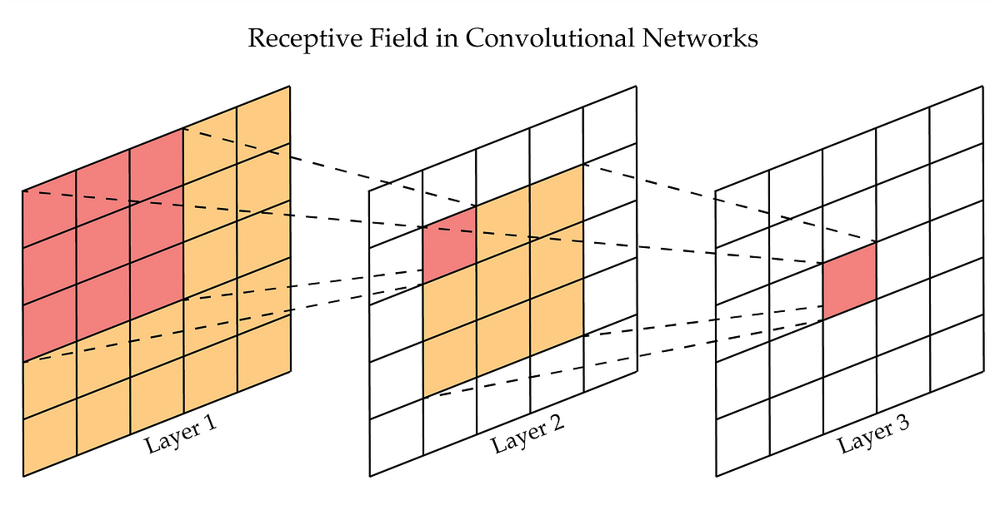

Source: https://medium.com/@rekalantar/receptive-fields-in-deep-convolutional-networks-43871d2ef2e9

### Stride, Padding



#### **1. Stride**

**Definition**

**Stride** refers to how many pixels the filter (kernel) moves at each step when sliding across the input.

- **Stride = 1** → The filter moves one pixel at a time, producing a large output feature map.
- **Stride > 1** → The filter moves multiple pixels at a time, reducing the spatial dimensions of the output.

**Mathematical Formula**

$$
O = \frac{I - K + 2P}{S} + 1
$$

where:
- $ I $ = input size (height/width)
- $ K $ = filter size (kernel size)
- $ S $ = stride
- $ P $ = padding
- $ O $ = output size

**Effects of Strides**

- **Larger strides (S > 1)** → Reduce spatial dimensions, less computation.
- **Smaller strides (S = 1)** → Retain more details, more computation.

| **Stride** | **Output Size (for a 5×5 input, 3×3 kernel, P = 0)** |
|------------|-----------------------------------------------------------|
| $ S = 1 $ | $ \frac{5 - 3 + 0}{1} + 1 ⇒ 3 \times 3 $ |
| $ S = 2 $ | $ \frac{5 - 3 + 0}{2} + 1 ⇒ 2 \times 2 $ |

#### **2. Padding**

**Definition**

Padding adds extra pixels (usually zeros) around the input to control the output size.

**Types of Padding**

1. **Valid Padding ("Valid" Mode, P = 0)**  
   - No extra pixels.
   - The output size usually shrinks.

2. **Same Padding ("Same" Mode, P > 0)**  
   - Padding ensures the output size remains the same as the input.
   - Formula (for $ S = 1 $):

     $$
     P = \frac{K - 1}{2}
     $$

3. **Full Padding** (adds more pixels than required)  
   - Used in special architectures like dilated convolutions.

| **Padding Type** | **Padding (P)** | **Output Size (for a 5×5 input, 3×3 kernel, S = 1)** |
|------------------|----------------|-----------------------------|
| Valid (no padding) | $ P = 0 $ | $ 3 \times 3 $ |
| Same (preserve size) | $ P = 1 $ | $ 5 \times 5 $ |


**Combined Effects of Strides and Padding**
- **Larger Strides (S > 1) → Downsampling** (reduces output size).
- **More Padding (P > 0) → Keeps the size larger**.
- **Trade-off Between Strides and Padding**:
  - Using **S = 1 and P = "same"** retains details.
  - Using **S > 1 with P = 0** shrinks the output size to reduce computational cost and help extract high-level abstract features while reducing spatial resolution.

# Question 1

According to the demonstration above, do you think the convolution operation is translational invariant (produce the same output regardless of the locations of features)? Why?

The gif below shows another example of convolution with zero Paddings (adding zeros at the boundaries of the input image).

In the gif below, the input is in blue, the filter is in gray, and the output is in green. The number of units in the output channel depends on the *stride* you set. In the gif below, the stride is 1 because the input image is sampled at each position, a stride of 2 would mean skipping over input positions. In most applications, especially with small filter sizes, a stride of 1 is used.

(*Technical note*: if filter size *K* is odd and you set the *pad=K//2* and *stride=1* (as is shown below), you get a **channel** of units that is the same size as the input. )

In [ ]:
# @markdown Execute this cell to view convolution gif (input size = 5 by 5, kernel size = 3, Stride = 1, Padding = 1, Output size = 5 by 5)

from IPython.display import Image
Image(url='https://miro.medium.com/max/790/1*1okwhewf5KCtIPaFib4XaA.gif')

# Coding Exercise 1

### Coding a Convolution

Here, we will write a function that performs convolution using the provided image and kernel matrices.

Note: in more general situations, once you understand convolutions, you can use functions already available in `pytorch`/`numpy` to perform convolution (such as `scipy.signal.correlate2d` or `scipy.signal.convolve2d`).

In [ ]:

#############################################################################
# Students: Fill in missing code (...) and comment or remove the next line
raise NotImplementedError("Coding Exercise #1")
#############################################################################

def convolution2d(image, kernel):
  """
  Convolves a 2D image matrix with a kernel matrix.

  Args:
    image: np.ndarray
      Image
    kernel: np.ndarray
      Kernel

  Returns:
    output: np.ndarray
      Output of convolution
  """
  # Get the height/width of the image, kernel, and output
  im_h, im_w = image.shape
  ker_h, ker_w = kernel.shape
  out_h = im_h - ker_h + 1
  out_w = im_w - ker_w + 1

  # Create an empty matrix in which to store the output
  output = np.zeros((out_h, out_w))

  # Iterate over the different positions at which to apply the kernel,
  # storing the results in the output matrix
  for out_row in range(out_h):
    for out_col in range(out_w):
      # Overlay the kernel on part of the image
      # (multiply each element of the kernel with some element of the image, then sum)
      # to determine the output of the matrix at a point
      current_product = 0
      for i in range(ker_h):
        for j in range(ker_w):
          current_product += ... # hint: image[?,?] * kernel[?,?]

      output[out_row, out_col] = current_product

  return output



## Tests
# First, we test the parameters we used before in the manual-calculation example
image = np.array([[0, 200, 200], [0, 0, 200], [0, 0, 0]])
kernel = np.array([[0.25, 0.25], [0.25, 0.25]])
check_conv_function(convolution2d, image, kernel)

# Next, we test with a different input and kernel (the numbers 1-9 and 1-4)
image = np.arange(9).reshape(3, 3)
kernel = np.arange(4).reshape(2, 2)
check_conv_function(convolution2d, image, kernel)

✅ The function calculated the convolution correctly.
✅ The function calculated the convolution correctly.


We can then use our `convolution2d` function to compute the convolution of two kernels (one vertical and one horizontal) on a grayscale Chicago Skyline image.

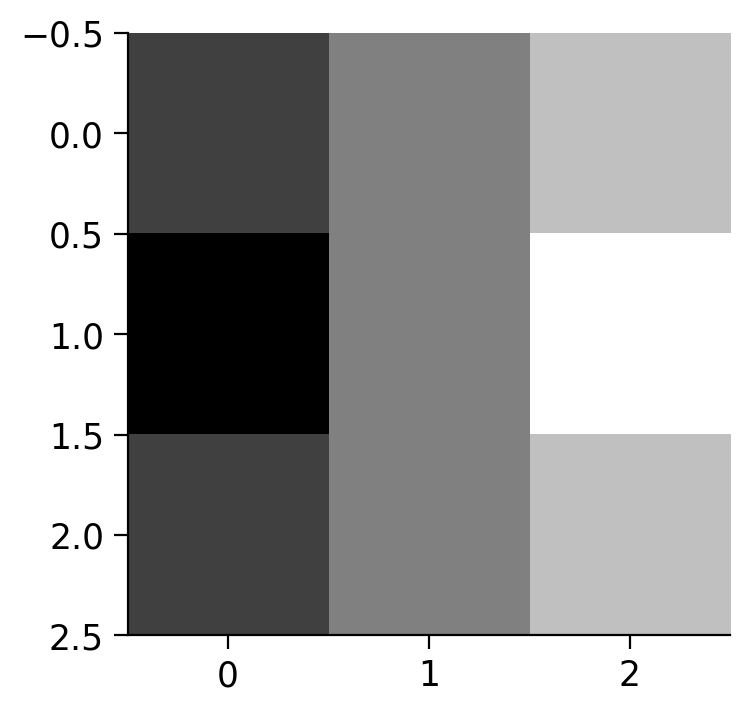

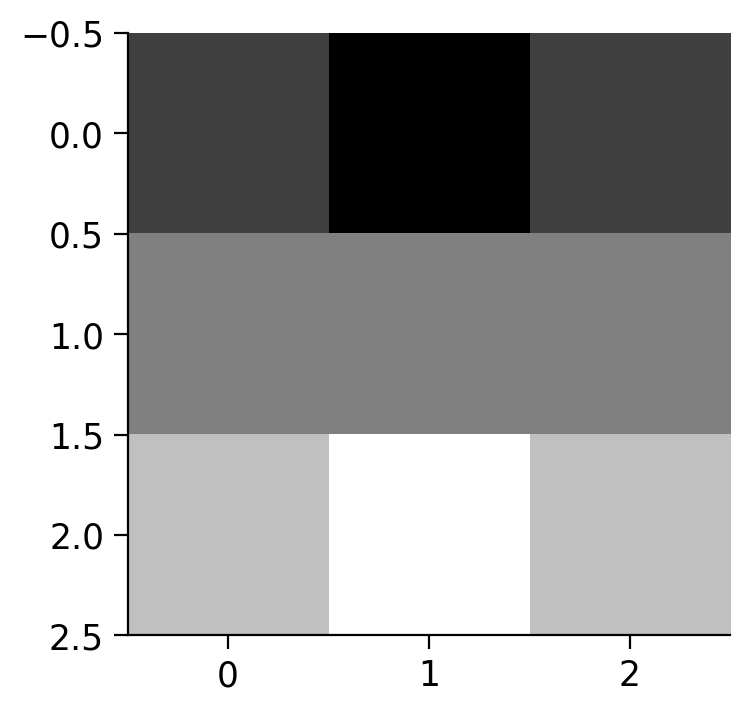

In [ ]:

kernel_ver = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
plt.figure(figsize=(4, 4))
plt.imshow(kernel_ver, cmap='gray', interpolation='nearest')

kernel_hor = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]).T
plt.figure(figsize=(4, 4))
plt.imshow(kernel_hor, cmap='gray', interpolation='nearest')

In [ ]:
# @markdown ### Load images (run me)

import requests, os

if not os.path.exists('images/'):
  os.mkdir('images/')

url = "https://raw.githubusercontent.com/NeuromatchAcademy/course-content-dl/main/tutorials/W2D2_ConvnetsAndDlThinking/static/chicago_skyline_shrunk_v2.bmp"
r = requests.get(url, allow_redirects=True)
with open("images/chicago_skyline_shrunk_v2.bmp", 'wb') as fd:
  fd.write(r.content)

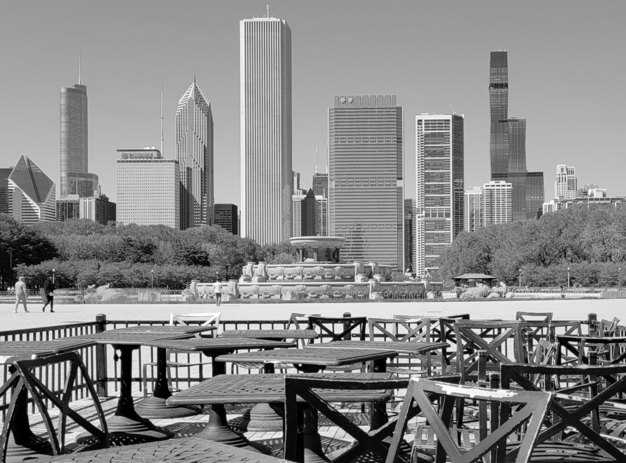

0

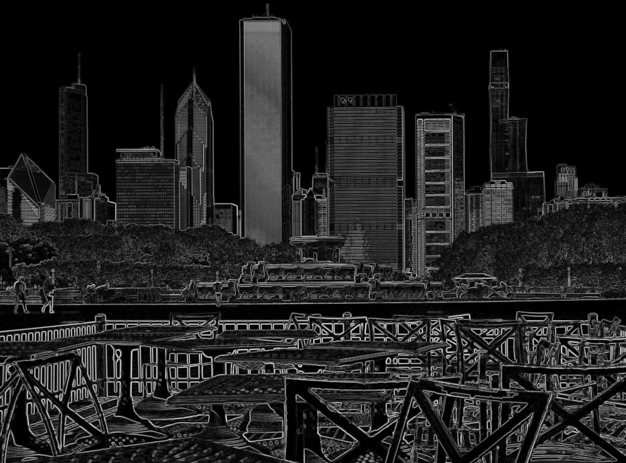

0

In [ ]:
# @title Convolution of Chicago Skyline
# Visualize the output of your function
from IPython.display import display as IPydisplay
from PIL import Image

with open("images/chicago_skyline_shrunk_v2.bmp", 'rb') as skyline_image_file:
  img_skyline_orig = Image.open(skyline_image_file)
  img_skyline_mat = np.asarray(img_skyline_orig)

  kernel_ver = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
  plt.figure(figsize=(4, 4))
  plt.imshow(kernel_ver, cmap='gray', interpolation='nearest')

  kernel_hor = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]).T
  plt.figure(figsize=(4, 4))
  plt.imshow(kernel_hor, cmap='gray', interpolation='nearest')

  img_processed_mat_ver = convolution2d(img_skyline_mat, kernel_ver)
  img_processed_mat_hor = convolution2d(img_skyline_mat, kernel_hor)
  img_processed_mat = np.sqrt(np.multiply(img_processed_mat_ver,
                                          img_processed_mat_ver) + \
                              np.multiply(img_processed_mat_hor,
                                          img_processed_mat_hor))

  img_processed_mat *= 255.0/img_processed_mat.max()
  img_processed_mat = img_processed_mat.astype(np.uint8)
  img_processed = Image.fromarray(img_processed_mat, 'L')
  width, height = img_skyline_orig.size
  scale = 0.6
  IPydisplay(img_skyline_orig.resize((int(width*scale), int(height*scale))),
             Image.NEAREST)
  IPydisplay(img_processed.resize((int(width*scale), int(height*scale))),
             Image.NEAREST)

# Question 2

### Using convlutional filters as a way of parameter sharing

Can you explain why using convolutional filters in CNNs may be considered as a way of parameter sharing?



## Pooling

Convolutional layers create feature maps that summarize the presence of particular features (e.g., edges) in the input. However, these feature maps record the _precise_ position of features in the input. That means that small changes to the position of an object in an image can result in a very different feature map. But a cup is a cup no matter where it appears in the image!  We need to achieve _translational invariance_.

A common approach to this problem is called downsampling. Downsampling creates a lower-resolution version of an image, retaining the large structural elements and removing some of the fine detail that may be less relevant to the task. In CNNs, Max-Pooling and Average-Pooling are used to downsample.  These operations shrink the size of the hidden layers, and produce features that are more translationally invariant, which can be better leveraged by subsequent layers.

Like convolutional layers, pooling layers have fixed-shape windows (pooling windows) that are systematically applied to the input.  As with filters, we can change the shape of the window and the size of the stride.  And, just like with filters, every time we apply a pooling operation we produce a single output.

Pooling performs a kind of information compression that provides summary statistics for a _neighborhood_ of the input.
- In Maxpooling, we compute the maximum value of all pixels in the pooling window.
- In Avgpooling, we compute the average value of all pixels in the pooling window.

The example below shows the result of Maxpooling within the yellow pooling windows to create the red pooling output matrix.

<figure>
    <center><img src=https://developers.google.com/machine-learning/glossary/images/PoolingConvolution.svg?hl=fr width=400px>
    <figcaption>An Example of Pooling with a kernel size of 2</figcaption>
    </center>
</figure>

Pooling gives our network translational invariance by providing a summary of the values in each pooling window. Thus, a small change in the features of the underlying image won't make a huge difference to the output.

Note that, unlike a convolutional layer, the pooling layer contains no learned parameters! Pooling just computes a pre-determined summary of the input and passes that along.  This is in contrast to the convolutional layer, where there are filters to be learned.


In [ ]:

# @markdown Execute this cell to view pooling gif

from IPython.display import Image
Image(url='https://towardsdatascience.com/wp-content/uploads/2018/05/1Vh0P1FxPpMm21rkTxqst5Q.gif')

# Question 3

According to the demonstration above, do you think the pooling operation introduces translational invariance (produce the same output regardless of the locations of features)? Why?

## Convolution and Parameter Sharing

Convolutional layers are different from their fully connected counterparts in two ways:

  * In a fully connected layer, each unit computes a weighted sum over all the input units. In a convolutional layer, on the other hand, each unit computes a weighted sum over only a small patch of the input, referred to as the unit's **receptive field**. When the input is an image, the receptive field can be thought of as a local patch of pixels.

  * In a fully connected layer, each unit uses its own independent set of weights to compute the weighted sum. In a convolutional layer, all the units (within the same channel) **share the same weights**. This set of shared weights is called the **convolutional filter**. The result of this computation is a convolution, where each unit has computed the same weighted sum over a different part of the input. This reduces the number of parameters in the network substantially.

<p align="center">
  <img src="https://github.com/NeuromatchAcademy/course-content/blob/main/tutorials/static/weight-sharing.png?raw=true" width="700" />
</p>


### Number of Parameters in Convolutional vs. Fully-connected Models
Convolutional networks encourage weight-sharing by learning a single kernel that is repeated over the entire input image. In general, this kernel is just a few parameters, compared to the huge number of parameters in a dense network.

<br>
<center>
  <img src=https://raw.githubusercontent.com/NeuromatchAcademy/course-content-dl/main/tutorials/W2D2_ConvnetsAndDlThinking/static/img_params.png>
  <figcaption> Parameter comparison</figcaption>
</center>


The difference in parameters is huge, and it continues to increase as the input image size increases. Larger images require that the linear layer use a matrix that can be directly multiplied with the input pixels.

<br>

While pooling does not reduce the number of parameters for a subsequent convolutional layer, it does decreases the image size. Therefore, later dense layers will need fewer parameters.

<br>

The CNN parameter size, however, is invariant of the image size, as irrespective of the input that it gets, it keeps sliding the same learnable filter over the images.

The reduced parameter set not only brings down memory usage by huge chunks, but it also allows the model to generalize better.


Images are high dimensional. That is to say that `image_length` * `image_width` * `image_channels` is a big number, and multiplying that big number by a normal sized fully-connected layer leads to a ton of parameters to learn. Convolutional neural network is one way of working around high dimensionality in images and other domains.

The widget below calculates the parameters required for a single convolutional or fully connected layer that operates on an image of a certain height and width.

The number of parameters of a convolutional layer $l$ are calculated as:

\begin{equation}
\text{num_of_params}_l = \left[ \left( H \times W \times K_{l-1} \right) + 1 \right] \times K_l
\end{equation}

where $H$ denotes the shape of the height of the filter, $W$ the shape of the width of the filter, and $K_l$ denotes the number of the filters in the $l$-th layer. The added $1$ is because of the bias term for each filter.

While a fully connected layer contains:

\begin{equation}
\text{num_of_params}_l = \left[ \left( N_{l-1} \times N_l \right) + 1 \times N_l \right]
\end{equation}

where $N_l$ denotes the number of nodes in the $l$-th layer.

Adjust the sliders to gain an intuition for how different model and data characteristics affect the number of parameters your model need to fit.

Note: these classes are designed to show parameter scaling in the first layer of a network, to be actually useful they would need more layers, an activation function, etc.

In [ ]:
class FullyConnectedNet(nn.Module):
  """
  Fully connected network with the following structure:
  nn.Linear(self.input_size, 256)
  """

  def __init__(self):
    """
    Initialize parameters of FullyConnectedNet

    Args:
      None

    Returns:
      Nothing
    """
    super(FullyConnectedNet, self).__init__()

    image_width = 128
    image_channels = 3
    self.input_size = image_channels * image_width ** 2

    self.fc1 = nn.Linear(self.input_size, 256)

  def forward(self, x):
    """
    Forward pass of FullyConnectedNet

    Args:
      x: torch.tensor
        Input data

    Returns:
      x: torch.tensor
        Output from FullyConnectedNet
    """
    x = x.view(-1, self.input_size)
    return self.fc1(x)

In [ ]:
class ConvNet(nn.Module):
  """
  Convolutional Neural Network
  """

  def __init__(self):
    """
    Initialize parameters of ConvNet

    Args:
      None

    Returns:
      Nothing
    """
    super(ConvNet, self).__init__()

    self.conv1 = nn.Conv2d(in_channels=3,
                            out_channels=256,
                            kernel_size=(3, 3),
                            padding=1)

  def forward(self, x):
    """
    Forward pass of ConvNet

    Args:
      x: torch.tensor
        Input data

    Returns:
      x: torch.tensor
        Output after passing x through Conv2d layer
    """
    return self.conv1(x)

Write a function that calculates the number of parameters of a given network. Apply the function to the above defined fully-connected network and convolutional network and compare the parameter counts.

**Hint:** `torch.numel`

# Coding Exercise 2

In [ ]:

#############################################################################
# Students: Fill in missing code (...) and comment or remove the next line
raise NotImplementedError("Coding Exercise #2")
#############################################################################

def get_parameter_count(network):
  """
  Calculate the number of parameters used by the fully connected/convolutional network.
  Hint: Casting the result of network.parameters() to a list may make it
        easier to work with

  Args:
    network: nn.module
      Network to calculate the parameters of fully connected/convolutional network

  Returns:
    param_count: int
      The number of parameters in the network
  """

  # Get the network's parameters
  parameters = network.parameters()

  param_count = 0
  # Loop over all layers
  for layer in parameters:
    param_count += ... # hint: torch.numel()

  return param_count



# Initialize networks
fccnet = FullyConnectedNet()
convnet = ConvNet()
## Apply the above defined function to both networks by uncommenting the following lines
print(f"FCCN parameter count: {get_parameter_count(fccnet)}")
print(f"ConvNet parameter count: {get_parameter_count(convnet)}")

FCCN parameter count: 12583168
ConvNet parameter count: 7168


## Interactive Demo: Check your results
The widget below calculates the number of parameters in a FCNN and CNN with the same architecture as our models above. Our models had an input image that was 128x128, and used 256 filters (or 256 nodes in the FCNN case). Check that the calculations you made above are correct.

Note how few parameters the convolutional networks take, especially as you increase the input image size.

In [ ]:
# @title Parameter Calculator
# @markdown Run this cell to enable the widget!

def calculate_parameters(filter_count, image_width,
                         fcnn_nodes):
  """
  Implement how parameters
  scale as a function of image size
  between convnets and FCNN

  Args:
    filter_count: int
      Number of filters
    image_width: int
      Width of image
    fcnn_nodes: int
      Number of fCNN nodes

  Returns:
    None
  """

  filter_width = 3
  image_channels = 3

  # Assuming a square, RGB image
  image_area = image_width ** 2
  image_volume = image_area * image_channels

  # If we're using padding=same, the output of a
  # convnet will be the same shape
  # as the original image, but with more features
  fcnn_parameters = image_volume * fcnn_nodes
  cnn_parameters = image_channels * filter_count * filter_width ** 2

  # Add bias
  fcnn_parameters += fcnn_nodes
  cnn_parameters += filter_count

  print(f"CNN parameters: {cnn_parameters}")
  print(f"Fully Connected parameters: {fcnn_parameters}")

  return None


_ = widgets.interact(calculate_parameters,
                     filter_count=(16, 512, 16),
                     image_width=(16, 512, 16),
                     fcnn_nodes=(16, 512, 16))

interactive(children=(IntSlider(value=256, description='filter_count', max=512, min=16, step=16), IntSlider(va…

For the interactive demo below, you can compare the number of parameters when there are different numbers of convolutional layers and dense layers in the two kinds of networks.

In [ ]:
# @markdown *Run this cell to enable the widget*
import io, base64
from ipywidgets import interact, interactive, fixed, interact_manual


def do_plot(image_size, batch_size, number_of_Linear, number_of_Conv2d,
            kernel_size, pooling, Final_Layer):
  sample_image = torch.rand(batch_size, 1, image_size, image_size)
  linear_layer = []
  linear_nets = []
  code_dense = ""

  code_dense += f"model_dense = nn.Sequential(\n"
  code_dense += f"    nn.Flatten(),\n"
  for i in range(number_of_Linear):
    linear_layer.append(nn.Linear(image_size * image_size * 1,
                                  image_size * image_size * 1,
                                  bias=False))
    linear_nets.append(nn.Sequential(*linear_layer))
    code_dense += f"    nn.Linear({image_size}*{image_size}*1, {image_size}*{image_size}*1, bias=False),\n"
  if Final_Layer is True:
    linear_layer.append(nn.Linear(image_size * image_size * 1, 10,
                                  bias=False))
    linear_nets.append(nn.Sequential(*linear_layer))
    code_dense += f"    nn.Linear({image_size}*{image_size}*1, 10, bias=False)\n"
  code_dense += ")\n"
  code_dense += "result_dense = model_dense(sample_image)\n"
  linear_layer = nn.Sequential(*linear_layer)

  conv_layer = []
  conv_nets = []
  code_conv = ""

  code_conv += f"model_conv = nn.Sequential(\n"
  for i in range(number_of_Conv2d):
    conv_layer.append(nn.Conv2d(in_channels=1,
                                out_channels=1,
                                kernel_size=kernel_size,
                                padding=kernel_size // 2,
                                bias=False))

    conv_nets.append(nn.Sequential(*conv_layer))
    code_conv += f"    nn.Conv2d(in_channels=1, out_channels=1, kernel_size={kernel_size}, padding={kernel_size//2}, bias=False),\n"
    if pooling > 0:
      conv_layer.append(nn.MaxPool2d(2, 2))
      code_conv += f"    nn.MaxPool2d(2, 2),\n"
    conv_nets.append(nn.Sequential(*conv_layer))
  if Final_Layer is True:
    conv_layer.append(nn.Flatten())
    code_conv += f"    nn.Flatten(),\n"
    conv_nets.append(nn.Sequential(*conv_layer))
    shape_conv = conv_nets[-1](sample_image).shape
    conv_layer.append(nn.Linear(shape_conv[1], 10, bias=False))
    code_conv += f"    nn.Linear({shape_conv[1]}, 10, bias=False),\n"
    conv_nets.append(nn.Sequential(*conv_layer))
  conv_layer = nn.Sequential(*conv_layer)
  code_conv += ")\n"
  code_conv += "result_conv = model_conv(sample_image)\n"


  t_1 = time.time()
  shape_linear = linear_layer(torch.flatten(sample_image, 1)).shape
  t_2 = time.time()
  shape_conv = conv_layer(sample_image).shape
  t_3 = time.time()

  print("Time taken by Dense Layer {}".format(t_2 - t_1))
  print("Time taken by Conv Layer  {}".format(t_3 - t_2))

  ax = plt.axes((0, 0, 1, 1))
  ax.spines["left"].set_visible(False)
  plt.yticks([])
  ax.spines["bottom"].set_visible(False)
  ax.spines["right"].set_visible(False)
  ax.spines["top"].set_visible(False)
  plt.xticks([])
  p1 = sum(p.numel() for p in linear_layer.parameters())
  nl = '\n'
  p2 = sum(p.numel() for p in conv_layer.parameters())
  plt.text(0.1, 0.8,
           f"Total Parameters in Dense Layer {p1:10,d}{nl}Total Parameters in Conv Layer   {p2:10,d}")

  plt.text(0.23, 0.62, "Dense Net", rotation=90,
           color='k', ha="center", va="center")

  def addBox(x, y, w, h, color, text1, text2, text3):
      """
      Function to render widget
      """
      ax.add_patch(plt.Rectangle((x, y), w, h, fill=True, color=color,
                                 alpha=0.5, zorder=1000, clip_on=False))
      plt.text(x + 0.02, y + h / 2, text1, rotation=90,
               va="center", ha="center", size=12)
      plt.text(x + 0.05, y + h / 2, text2, rotation=90,
               va="center", ha="center")
      plt.text(x + 0.08, y + h / 2, text3, rotation=90,
               va="center", ha="center", size=12)

  x = 0.25
  if 1:
    addBox(x, 0.5, 0.08, 0.25, [1, 0.5, 0], "Flatten",
           tuple(torch.flatten(sample_image, 1).shape), "")
    x += 0.08 + 0.01

  for i in range(number_of_Linear):
    addBox(x, 0.5, 0.1, 0.25, "g", "Dense",
           tuple(linear_nets[i](torch.flatten(sample_image, 1)).shape),
           list(linear_layer.parameters())[i].numel())
    x += 0.11

  if Final_Layer is True:
    i = number_of_Linear
    addBox(x, 0.5, 0.1, 0.25, "g", "Dense",
           tuple(linear_nets[i](torch.flatten(sample_image, 1)).shape),
           list(linear_layer.parameters())[i].numel())

  plt.text(0.23, 0.1 + 0.35 / 2, "Conv Net",
           rotation=90, color='k',
           ha="center", va="center")
  x = 0.25

  for i in range(number_of_Conv2d):
    addBox(x, 0.1, 0.1, 0.35, "r", "Conv",
           tuple(conv_nets[i * 2](sample_image).shape),
           list(conv_nets[i * 2].parameters())[-1].numel())
    x += 0.11
    if pooling > 0:
      addBox(x, 0.1, 0.08, 0.35, [0, 0.5, 1], "Pooling",
             tuple(conv_nets[i * 2 + 1](sample_image).shape), "")
      x += 0.08 + 0.01

  if Final_Layer is True:
    i = number_of_Conv2d
    addBox(x, 0.1, 0.08, 0.35, [1, 0.5, 0], "Flatten",
           tuple(conv_nets[i * 2](sample_image).shape), "")
    x += 0.08 + 0.01

    addBox(x, 0.1, 0.1, 0.35, "g", "Dense",
            tuple(conv_nets[i * 2 + 1](sample_image).shape),
            list(conv_nets[i * 2 + 1].parameters())[-1].numel())
    x += 0.11

  plt.text(0.08, 0.3 + 0.35 / 2,
           "Input", rotation=90, color='b', ha="center", va="center")

  ax.add_patch(plt.Rectangle((0.1, 0.3), 0.1, 0.35, fill=True, color='b',
                             alpha=0.5, zorder=1000, clip_on=False))
  plt.text(0.1 + 0.1 / 2, 0.3 + 0.35 / 2, tuple(sample_image.shape),
           rotation=90, va="center", ha="center")

  # Plot
  plt.gcf().set_tight_layout(False)
  my_stringIObytes = io.BytesIO()
  plt.savefig(my_stringIObytes, format='png', dpi=90)
  my_stringIObytes.seek(0)
  my_base64_jpgData = base64.b64encode(my_stringIObytes.read())

  del linear_layer, conv_layer

  plt.close()
  mystring = """<img src="data:image/png;base64,""" + str(my_base64_jpgData)[2:-1] + """" alt="Graph">"""

  return code_dense, code_conv, mystring


# Parameters
caption = widgets.Label(value='The values of range1 and range2 are synchronized')
slider_batch_size = widgets.IntSlider(value=100, min=10, max=100, step=10,
                                      description="BatchSize")
slider_image_size = widgets.IntSlider(value=32, min=32, max=128, step=32,
                                      description="ImageSize")
slider_number_of_Linear = widgets.IntSlider(value=1,min=1, max=3, step=1,
                                            description="NumDense")
slider_number_of_Conv2d = widgets.IntSlider(value=1, min=1, max=2, step=1,
                                            description="NumConv")
slider_kernel_size = widgets.IntSlider(value=5, min=3, max=21, step=2,
                                       description="KernelSize")
input_pooling = widgets.Checkbox(value=False,
                                 description="Pooling")
input_Final_Layer = widgets.Checkbox(value=False,
                                     description="Final_Layer")

output_code1 = widgets.HTML(value="", )

output_plot = widgets.HTML(value="", )


def plot_func(batch_size, image_size,
              number_of_Linear, number_of_Conv2d,
              kernel_size, pooling, Final_Layer):

    code1, code2, plot = do_plot(image_size, batch_size,
                                 number_of_Linear, number_of_Conv2d,
                                 kernel_size, pooling, Final_Layer)
    output_plot.value = plot

    output_code1.value = """
    <!DOCTYPE html>
    <html>
      <head>
        <style>
          * {
            box-sizing: border-box;
          }
          .column {
            float: left;
            /*width: 33.33%;*/
            padding: 5px;
          }
          /* Clearfix (clear floats) */
          .row::after {
            content: "";
            clear: both;
            display: table;
          }
          pre {
            line-height: 1.2em;
          }
        </style>
      </head>

      <body>
        <div class="row">
          <div class="column" style="overflow-x: scroll;">
          <h2>Code for Dense Network</h2>
          <pre>""" + code1 + """</pre>
        </div>
          <div class="column" style="overflow-x: scroll;">
          <h2>Code for Conv Network</h2>
          <pre>""" + code2 + """</pre>
          </div>
        </div>
      </body>
    </html>
"""

out = widgets.interactive_output(plot_func, {
    "batch_size": slider_batch_size,
    "image_size": slider_image_size,
    "number_of_Linear": slider_number_of_Linear,
    "number_of_Conv2d": slider_number_of_Conv2d,
    "kernel_size": slider_kernel_size,
    "pooling": input_pooling,
    "Final_Layer": input_Final_Layer,
})

ui = widgets.VBox([slider_batch_size, slider_image_size,
                   slider_number_of_Linear,
                   widgets.HBox([slider_number_of_Conv2d,
                                 slider_kernel_size,
                                 input_pooling]),
                   input_Final_Layer])
display(widgets.HBox([output_plot, output_code1]), ui)
display(out)

Output()

# Question 4

What conclusion can you make about the number of parameters in a CNN and a fully connected dense layer?

# Implement a Convolutional Neural Network

Let's stack up all we have learnt. Create a CNN with the following structure. <br>
- Convolution `nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3)`
- Convolution `nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3)`
- Pool Layer `nn.MaxPool2d(kernel_size=2)`
- Fully Connected Layer `nn.Linear(in_features=9216, out_features=128)`
- Fully Connected layer `nn.Linear(in_features=128, out_features=2)`

Note: As discussed in the video, we would like to flatten the output from the Convolutional Layers before passing on the Linear layers, thereby converting an input of shape $[\text{BatchSize}, \text{Channels}, \text{Height}, \text{Width}]$ to $[\text{BatchSize}, \text{Channels} \times \text{Height} \times \text{Width}]$, which in this case would be from $[32, 64, 12, 12]$ (output of second convolution layer) to $[32, 64 \times 12 \times 12] = [32, 9216]$. Recall that the input images have size $[28, 28]$.

Hint: You could use `torch.flatten(x, 1)` in order to flatten the input at this stage. The $1$ means it flattens dimensions starting with dimensions 1 in order to exclude the batch dimension from the flattening.

We should also stop to think about how we get the output of the pooling layer to be $12 \times 12$. It is because first, the two `Conv2d` with a `kernel_size=3` operations cause the image to be reduced to $26 \times 26$ and the second `Conv2d` reduces it to $24 \times 24$. Finally, the `MaxPool2d` operation reduces the output size by half to $12 \times 12$.

Also, don't forget the ReLUs (use e.g., `F.ReLU`)! No need to add a ReLU after the final fully connected layer.



We download the data. Notice that here, we normalize the dataset.

In [ ]:
# @title Download EMNIST dataset

# webpage: https://www.itl.nist.gov/iaui/vip/cs_links/EMNIST/gzip.zip
fname = 'EMNIST.zip'
folder = 'EMNIST'
url = "https://osf.io/xwfaj/download"
download_data(fname, folder, url, tar=False)




Extracting the files...



In [ ]:
# @title Dataset/DataLoader Functions

def get_Xvs0_dataset(normalize=False, download=False):
  """
  Load Dataset

  Args:
    normalize: boolean
      If true, normalise dataloader
    download: boolean
      If true, download dataset

  Returns:
    emnist_train: torch.loader
      Training Data
    emnist_test: torch.loader
      Test Data
  """
  if normalize:
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.1307,), (0.3081,))
        ])
  else:
    transform = transforms.Compose([
        transforms.ToTensor(),
        ])

  emnist_train = datasets.EMNIST(root='.',
                                 split='letters',
                                 download=download,
                                 train=True,
                                 transform=transform)
  emnist_test = datasets.EMNIST(root='.',
                                split='letters',
                                download=download,
                                train=False,
                                transform=transform)

  # Only want O (15) and X (24) labels
  train_idx = (emnist_train.targets == 15) | (emnist_train.targets == 24)
  emnist_train.targets = emnist_train.targets[train_idx]
  emnist_train.data = emnist_train.data[train_idx]

  # Convert Xs predictions to 1, Os predictions to 0
  emnist_train.targets = (emnist_train.targets == 24).type(torch.int64)

  test_idx = (emnist_test.targets == 15) | (emnist_test.targets == 24)
  emnist_test.targets = emnist_test.targets[test_idx]
  emnist_test.data = emnist_test.data[test_idx]

  # Convert Xs predictions to 1, Os predictions to 0
  emnist_test.targets = (emnist_test.targets == 24).type(torch.int64)

  return emnist_train, emnist_test


def get_data_loaders(train_dataset, test_dataset,
                     batch_size=32, seed=0):
  """
  Helper function to fetch dataloaders

  Args:
    train_dataset: torch.tensor
      Training data
    test_dataset: torch.tensor
      Test data
    batch_size: int
      Batch Size
    seed: int
      Set seed for reproducibility

  Returns:
    emnist_train: torch.loader
      Training Data
    emnist_test: torch.loader
      Test Data
  """
  g_seed = torch.Generator()
  g_seed.manual_seed(seed)

  train_loader = DataLoader(train_dataset,
                            batch_size=batch_size,
                            shuffle=True,
                            num_workers=2,
                            worker_init_fn=seed_worker,
                            generator=g_seed)
  test_loader = DataLoader(test_dataset,
                           batch_size=batch_size,
                           shuffle=True,
                           num_workers=2,
                           worker_init_fn=seed_worker,
                           generator=g_seed)

  return train_loader, test_loader

Let's view a couple samples from the dataset.

In [ ]:

set_seed(SEED)
emnist_train, emnist_test = get_Xvs0_dataset(normalize=True)
train_loader, test_loader = get_data_loaders(emnist_train, emnist_test,
                                             seed=SEED)

Random seed 0 has been set.


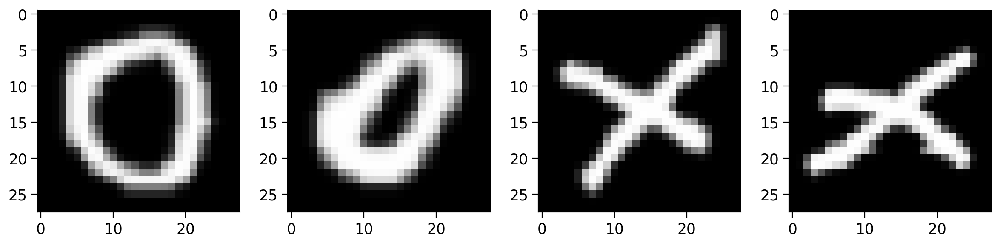

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(12, 6))
ax1.imshow(emnist_train[0][0].reshape(28, 28), cmap='gray')
ax2.imshow(emnist_train[10][0].reshape(28, 28), cmap='gray')
ax3.imshow(emnist_train[4][0].reshape(28, 28), cmap='gray')
ax4.imshow(emnist_train[6][0].reshape(28, 28), cmap='gray')
plt.show()

In [ ]:
# Train/Test Functions

def train(model, device, train_loader, epochs):
  """
  Training function

  Args:
    model: nn.module
      Neural network instance
    device: string
      GPU/CUDA if available, CPU otherwise
    epochs: int
      Number of epochs
    train_loader: torch.loader
      Training Set

  Returns:
    Nothing
  """
  model.train()

  criterion = nn.CrossEntropyLoss()
  optimizer = torch.optim.SGD(model.parameters(), lr=0.01)
  for epoch in range(epochs):
    with tqdm(train_loader, unit='batch') as tepoch:
      for data, target in tepoch:
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)

        loss = criterion(output, target)
        loss.backward()
        optimizer.step()
        tepoch.set_postfix(loss=loss.item())


def test(model, device, data_loader):
  """
  Test function

  Args:
    model: nn.module
      Neural network instance
    device: string
      GPU/CUDA if available, CPU otherwise
    data_loader: torch.loader
      Test Set

  Returns:
    acc: float
      Test accuracy
  """
  model.eval()
  correct = 0
  total = 0
  for data in data_loader:
    inputs, labels = data
    inputs = inputs.to(device).float()
    labels = labels.to(device).long()

    outputs = model(inputs)
    _, predicted = torch.max(outputs, 1)
    total += labels.size(0)
    correct += (predicted == labels).sum().item()

  acc = 100 * correct / total
  return acc

# Coding Exercise 3

Implement the convolutional neural network that we described above

In [ ]:

#############################################################################
# Students: Fill in missing code (...) and comment or remove the next line
raise NotImplementedError("Coding Exercise #3")
#############################################################################

from tqdm.notebook import tqdm, trange

class EMNIST_Net(nn.Module):
  """
  Neural network instance with following structure
  nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3) # Convolutional Layer 1
  nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3) # Convolutional Layer 2
  nn.MaxPool2d(kernel_size=2) max-pooling layer#
  nn.Linear(in_features=9216, out_features=128) # Fully Connected Layer 1
  nn.Linear(in_features=128, out_features=2) # Fully Connected Layer 2
  """

  def __init__(self):
    """
    Initialize parameters of EMNISTNet

    Args:
      None

    Returns:
      Nothing
    """
    super(EMNIST_Net, self).__init__()
    self.conv1 = ...
    self.conv2 = ...
    self.pool = ...
    self.fc1 = ...
    self.fc2 = ...

  def forward(self, x):
    """
    Forward pass of EMNISTNet

    Args:
      x: torch.tensor
        Input features

    Returns:
      x: torch.tensor
        Output of final fully connected layer
    """
    x = self.conv1(x)
    x = F.relu(x) # relu activation
    x = ... # hint: self.conv2()
    x = ... # hint: relu activation
    x = ...
    x = torch.flatten(x, 1)
    x = ...
    x = ... # hint: relu activation
    x = ...
    return x



## Uncomment the lines below to train your network
emnist_net = EMNIST_Net().to(DEVICE)
print("Total Parameters in Network {:10d}".format(sum(p.numel() for p in emnist_net.parameters())))
train(emnist_net, DEVICE, train_loader, 1)
## Uncomment to test your model
print(f'Test accuracy is: {test(emnist_net, DEVICE, test_loader)}')

Total Parameters in Network    1198850


  0%|          | 0/300 [00:00<?, ?batch/s]

Test accuracy is: 99.0625


**Note:** We are using a softmax function here which converts a real value to a value between 0 and 1, which can be interpreted as a probability.

Input:


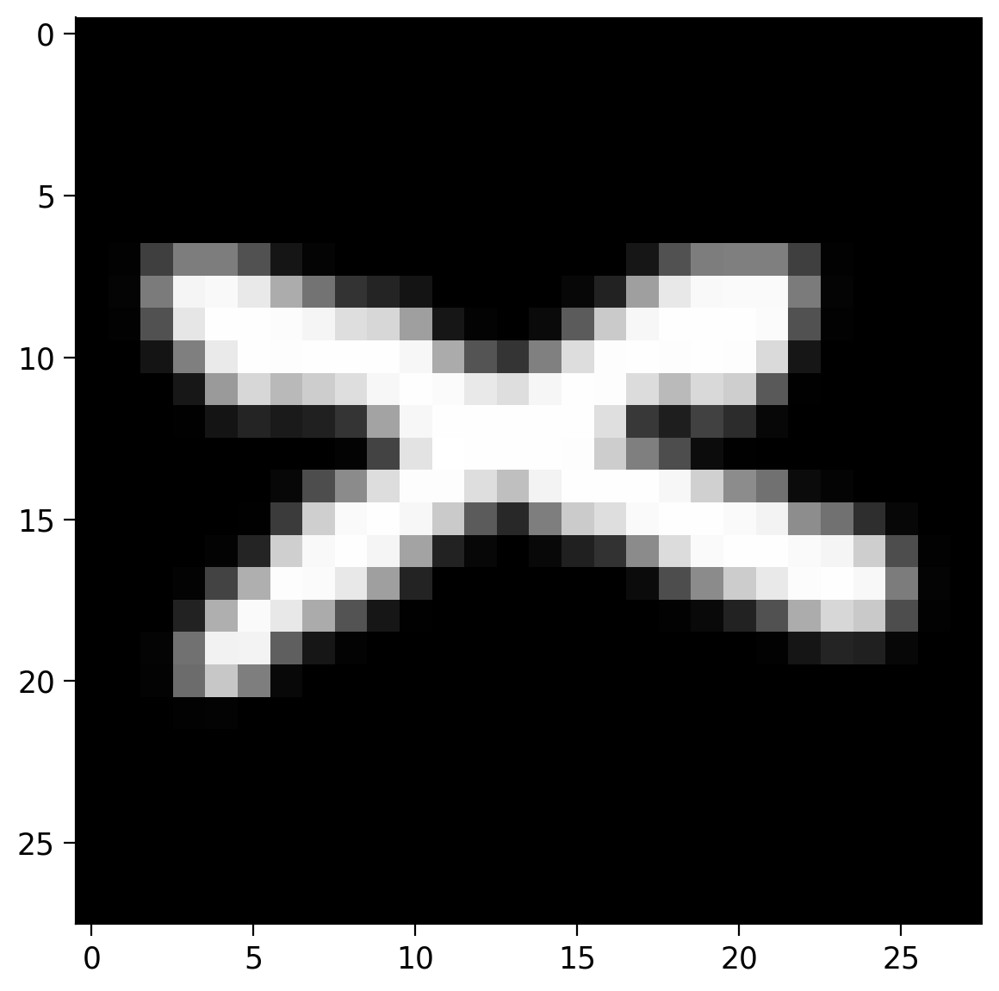


Result: tensor([[0.0027, 0.9973]], device='cuda:0', grad_fn=<SoftmaxBackward0>)
Confidence of image being an 'O': 0.00270299450494349
Confidence of image being an 'X': 0.9972969889640808


In [ ]:

# Index of an image in the dataset that corresponds to an X and O
x_img_idx = 11
o_img_idx = 0

print("Input:")
x_img = emnist_train[x_img_idx][0].unsqueeze(dim=0).to(DEVICE)
plt.imshow(emnist_train[x_img_idx][0].reshape(28, 28),
           cmap=plt.get_cmap('gray'))
plt.show()
output = emnist_net(x_img)
result = F.softmax(output, dim=1)
print("\nResult:", result)
print("Confidence of image being an 'O':", result[0, 0].item())
print("Confidence of image being an 'X':", result[0, 1].item())


The network is quite confident that this image is an $X$!

Note that this is evident from the softmax output, which shows the probabilities of the image belonging to each of the classes. There is a higher probability of belonging to class 1; i.e., class $X$.

Let us also test the network on an $O$ image.

Input:


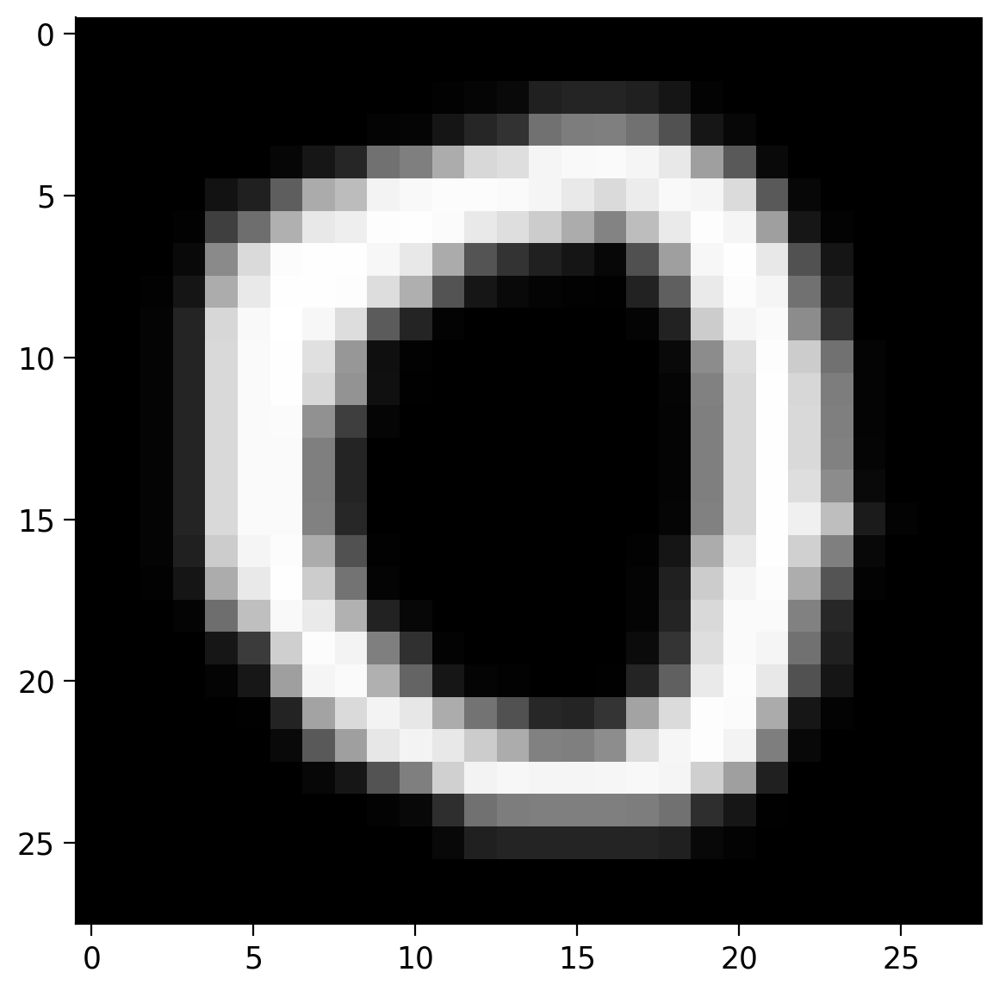


Result: tensor([[9.9967e-01, 3.3200e-04]], device='cuda:0', grad_fn=<SoftmaxBackward0>)
Confidence of image being an 'O': 0.9996680021286011
Confidence of image being an 'X': 0.0003319997922517359


In [ ]:
print("Input:")
o_img = emnist_train[o_img_idx][0].unsqueeze(dim=0).to(DEVICE)
plt.imshow(emnist_train[o_img_idx][0].reshape(28, 28),
           cmap=plt.get_cmap('gray'))
plt.show()
output = emnist_net(o_img)
result = F.softmax(output, dim=1)
print("\nResult:", result)
print("Confidence of image being an 'O':", result[0, 0].item())
print("Confidence of image being an 'X':", result[0, 1].item())

# Modern Convolutional Neural Networks

In [ ]:
# @title Set Up Code #4

# Import libraries
import os
import time
import tqdm
import torch
import IPython
import torchvision

import numpy as np
import matplotlib.pyplot as plt

import torch.nn as nn
import torch.nn.functional as F

from torchvision import transforms
from torchvision.models import AlexNet
from torchvision.utils import make_grid
from torchvision.datasets import ImageFolder

from PIL import Image
from io import BytesIO



Convolutional neural networks have been around for a long time. [The first CNN model](https://www.rctn.org/bruno/public/papers/Fukushima1980.pdf) was published in 1980, and was based on ideas in neuroscience that [predated it by decades](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC1359523/). The [AlexNet](https://proceedings.neurips.cc/paper/2012/hash/c399862d3b9d6b76c8436e924a68c45b-Abstract.html), a CNN model published in 2012, is generally considered to mark the start of the deep learning revolution.

The story of deep learning and CNNs has been one of scaling networks: making them bigger and deeper.



## Introduction to AlexNet

AlexNet arguably marked the start of the current age of deep learning.
It incorporates a number of the defining characteristics of successful DL today: deep networks, GPU-powered paralellization, and building blocks encoding task-specific priors.
In this section you'll have the opportunity to play with AlexNet and see the world through its eyes.

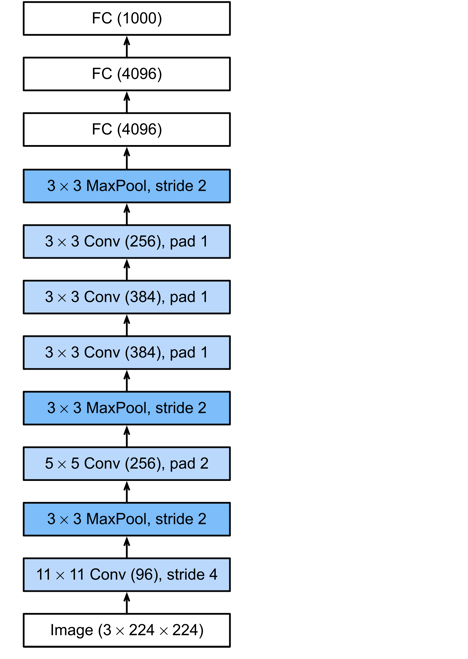

source: https://en.wikipedia.org/wiki/AlexNet

### **What Are the Two Key Innovations of AlexNet?**

AlexNet (Krizhevsky et al., 2012) introduced several techniques that significantly boosted CNN performance on the ImageNet challenge. Two of its most notable innovations are:

1. **Use of ReLU Activations (Rectified Linear Units)**  
   - Replaced the traditional sigmoid/tanh functions, leading to faster training and better gradient propagation.  
   - Helped mitigate the vanishing gradient problem, enabling deeper networks.

2. **Dropout for Regularization**  
   - Randomly “drops” (sets to zero) a certain fraction of neuron outputs during training.  
   - Prevents co-adaptation of neurons, dramatically reducing overfitting.  
   - Allowed AlexNet to generalize better on large-scale datasets.

These innovations, combined with GPU acceleration, data augmentation, and overlapping pooling, were pivotal in AlexNet’s breakthrough ImageNet performance.


**ReLU after convolutions**

The ReLU (Rectified Linear Unit) introduces non-linearity into our model, allowing us to learn a more complex function that can better predict the class of an image.

The ReLU function is shown below.

<br>

<figure>
  <center><img src=https://raw.githubusercontent.com/NeuromatchAcademy/course-content-dl/main/tutorials/W2D2_ConvnetsAndDlThinking/static/relu.png width=400px>
  <figcaption>The Rectified Linear Unit (ReLU) Activation Function<figcaption>
  </center>
</figure>

With **Dropout**, we literally drop out (zero out) some neurons during training. Throughout the training, the standard dropout zeros out some fraction (usually 50%) of the nodes in each layer, and on each iteration, before calculating the subsequent layer. Randomly selecting different subsets to drop out introduces noise into the process and reduces overfitting. Dropout is usually only used during training but not during validation and testing.

<br>

<center><img src="https://d2l.ai/_images/dropout2.svg" alt="Dropout" width="600"/></center>

<br>


In [ ]:
# @title Import Alexnet
# @markdown This cell gives you the `alexnet` model as well as the `input_image` and `input_batch` variables used below
import requests, urllib

# Original link: https://s3.amazonaws.com/pytorch/models/alexnet-owt-4df8aa71.pth
state_dict = torch.hub.load_state_dict_from_url("https://osf.io/9dzeu/download")

alexnet = AlexNet()
alexnet.load_state_dict(state_dict=state_dict)

url, filename = ("https://raw.githubusercontent.com/NeuromatchAcademy/course-content-dl/main/tutorials/W2D3_ModernConvnets/static/dog.jpg", "dog.jpg")
try: urllib.URLopener().retrieve(url, filename)
except: urllib.request.urlretrieve(url, filename)

input_image = Image.open(filename)
preprocess = transforms.Compose([
                                 transforms.Resize(256),
                                 transforms.CenterCrop(224),
                                 transforms.ToTensor(),
                                 transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                                      std=[0.229, 0.224, 0.225]),
                                 ])
input_tensor = preprocess(input_image)
input_batch = input_tensor.unsqueeze(0)  # Create a mini-batch as expected by the model

# Move the input and model to GPU for speed if available
if torch.cuda.is_available():
  input_batch = input_batch.cuda()
  alexnet.cuda()

Downloading: "https://osf.io/9dzeu/download" to /root/.cache/torch/hub/checkpoints/download
100%|██████████| 233M/233M [00:03<00:00, 64.1MB/s]


This code visualizes the top-layer filters learned by AlexNet. What do these filters remind you of?

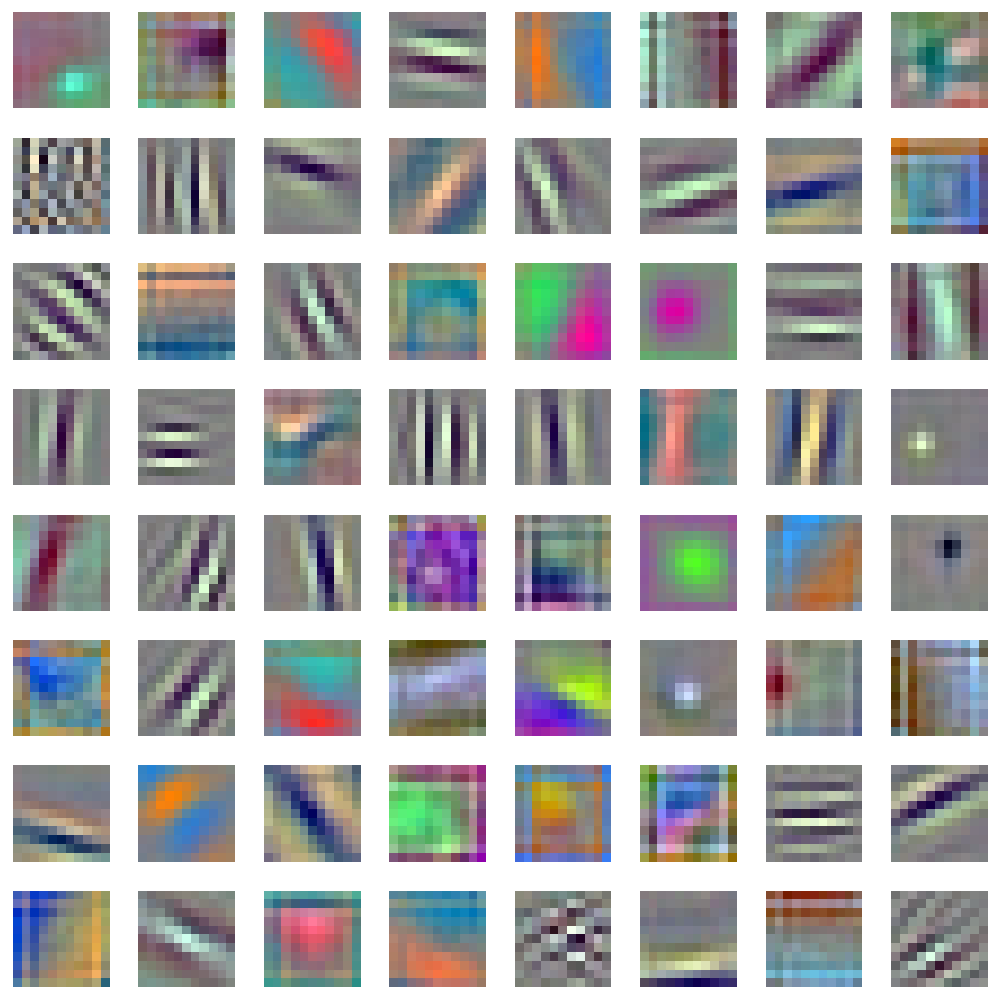

In [ ]:

with torch.no_grad():
  params = list(alexnet.parameters())
  fig, axs = plt.subplots(8, 8, figsize=(8, 8))
  filters = []
  for filter_index in range(params[0].shape[0]):
    row_index = filter_index // 8
    col_index = filter_index % 8

    filter = params[0][filter_index,:,:,:]
    filter_image = filter.permute(1, 2, 0).cpu()
    scale = np.abs(filter_image).max()
    scaled_image = filter_image / (2 * scale) + 0.5
    filters.append(scaled_image.cpu())
    axs[row_index, col_index].imshow(scaled_image.cpu())
    axs[row_index, col_index].axis('off')
  plt.show()

### Interactive Demo: What does AlexNet see?
One way of visualizing CNNs is to look at the output of individual filters for a given image. Below is a widget that lets you examine the outputs of various filters used in AlexNet.

interactive(children=(IntSlider(value=31, description='i', max=63), Output()), _dom_classes=('widget-interact'…

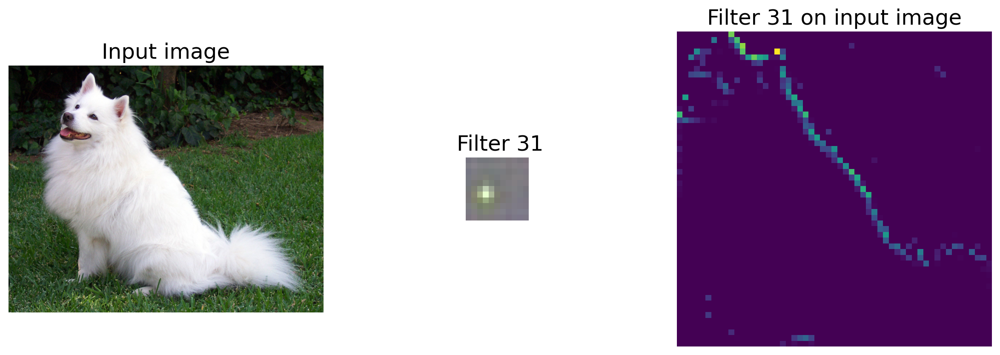

In [ ]:
# @markdown Run this cell to enable the widget

def alexnet_intermediate_output(net, image):
    """
    Function to extract AlexNet's intermediate output

    Args:
      net: nn.module
        AlexNet instance
      image: torch.tensor
        Input features

    Returns:
      ReLU output on processing features
    """
    return F.relu(net.features[0](image))


def browse_images(input_batch, input_image):
  """
  Helper function to browse images

  Args:
    input_batch: torch.tensor
      Input batch
    input_image: torch.tensor
      Input features

  Returns:
    Nothing
  """
  intermediate_output = alexnet_intermediate_output(alexnet, input_batch)
  n = intermediate_output.shape[1]

  def view_image(i):
    """
    Function to view incoming image frame

    Args:
      i: int
        Iteration

    Returns:
      Nothing
    """
    with torch.no_grad():
      channel = intermediate_output[0, i, :].squeeze()
      fig, ax = plt.subplots(1, 3, figsize=(12, 6))
      ax[0].imshow(input_image)
      ax[1].imshow(filters[i])
      ax[1].set_xlim([-22, 33])
      ax[2].imshow(channel.cpu())
      ax[0].set_title('Input image')
      ax[1].set_title(f"Filter {i}")
      ax[2].set_title(f"Filter {i} on input image")
      [axi.set_axis_off() for axi in ax.ravel()]

  widgets.interact(view_image, i=(0, n-1))


browse_images(input_batch, input_image)

## Introduction to ResNet

### The Vanishing Gradient Problem

The **vanishing gradient problem** occurs when the gradients in a neural network become **too small** during backpropagation, making it difficult for deep networks to learn.

**Why Does It Happen?**

During backpropagation, gradients are computed using the chain rule:

$$
\frac{\partial L}{\partial W} = \frac{\partial L}{\partial a} \cdot \frac{\partial a}{\partial z} \cdot \frac{\partial z}{\partial W}
$$

where:
- $ L $ is the loss function.
- $ a $ is the activation function output.
- $ z $ is the weighted sum of inputs.
- $ W $ is the weight matrix.

If the activation function has small derivatives, the gradients shrink exponentially across layers, leading to:
- **Very small weight updates**.
- **Slow learning** or **no learning** in early layers.

**Effects of Vanishing Gradients**
- **Slow convergence** or getting stuck with little improvement.
- **Poor feature learning** in early layers.
- **Deep networks fail to train properly**.

**Solutions to Vanishing Gradient**
1. **Use ReLU Activation**
   - Unlike **sigmoid** or **tanh**, **ReLU** avoids gradient shrinking.
   - Variants like **Leaky ReLU** or **ELU** help prevent "dying neurons."

2. **Use Batch Normalization**
   - Normalizes activations within each mini-batch to stabilize gradient flow.

3. **Use Skip Connections (Residual Networks or ResNets)**
   - ResNets allow gradients to bypass layers, preventing vanishing gradients.


### Solving the Vanishing Gradient Problem using ResNet

In this section we'll be working with a state of the art CNN model called [ResNet](https://arxiv.org/abs/1512.03385). ResNet has two particularly interesting features. First, it uses skip connections to avoid the vanishing gradient problem. Second, each block (collection of layers) in a ResNet can be treated as learning a residual function.

Mathematically, a neural network can be thought of as a series of operations that maps an input (like an image of a dog) to an output (like the label "dog"). In math-speak a mapping from an input to an output is called a function. Neural networks are a flexible way of expressing that function.

If you were to subtract out the true function mapping images to class labels from the function learned by a network, you'd be left with the residual error or "residual function". ResNets try to learn the original function, then the residual function, then the residual of the residual, and so on, using their residual blocks and adding them to the output of the preceeding layers.

In this section we'll run several images through a pre-trained ResNet and see what happens.

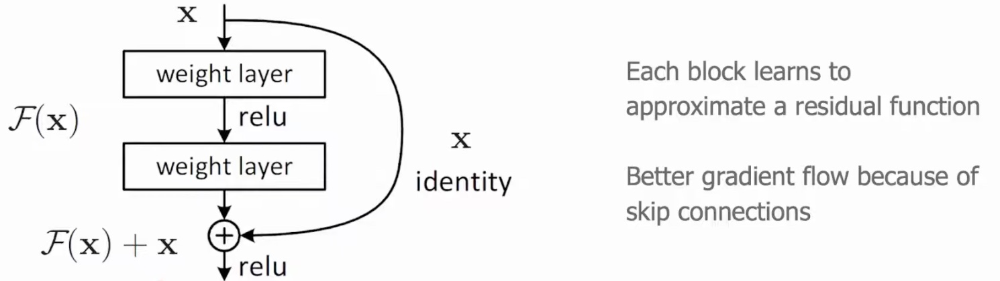

**How ResNet Updates Weights Using Backpropagation**

ResNet (Residual Network) updates its weights using **backpropagation**, but its **skip connections** help prevent the vanishing gradient problem and improve gradient flow.

**Backpropagation in ResNet: Skip Connections**

ResNet introduces **skip (identity) connections** that **bypass** intermediate layers. Instead of learning a direct mapping $ H(x) $, ResNet learns a **residual function**:

$$
H(x) = F(x) + x
$$

where:
- $ x $ is the input to the residual block.
- $ F(x) $ is the transformation (convolutions, batch norm, activation).
- $ H(x) $ is the final output of the residual block.

**Gradient Flow with Skip Connections**

During **backpropagation**, the gradient of the loss \( L \) with respect to earlier layers is:

$$
\frac{\partial L}{\partial x} = \frac{\partial L}{\partial H} \cdot \left( \frac{\partial H}{\partial x} \right)
$$

Since $ H(x) = F(x) + x $, its derivative is:

$$
\frac{\partial H}{\partial x} = \frac{\partial F}{\partial x} + 1
$$

This **"+1" term ensures gradients do not vanish**, allowing gradients to flow more easily through the network.



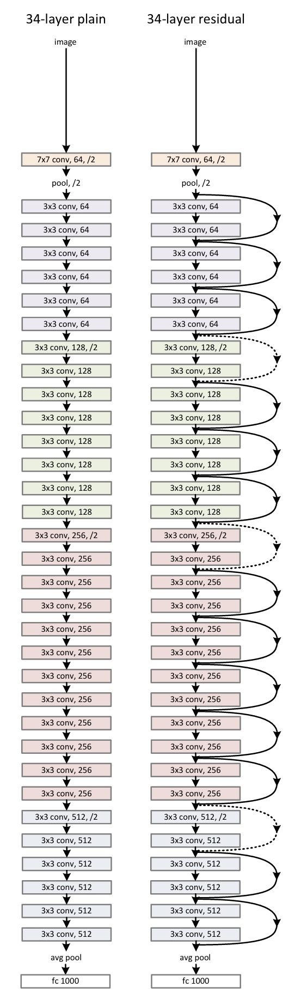

Left:a plain network with 34 layers(3.6billionFLOPs).

Right: a residual network (ResNet) with 34 layers (3.6billion FLOPs).

The dotted shortcuts increase dimensions.

source: https://arxiv.org/pdf/1512.03385

Here is how to define a simple residual block using Pytorch:

In [ ]:

import torch
import torch.nn as nn

# Define a simple Residual Block
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(in_channels)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(in_channels)

    def forward(self, x):
        residual = x  # Skip connection
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out += residual  # Adding skip connection
        return self.relu(out)

# Example forward pass
x = torch.randn(1, 64, 32, 32)  # Example input tensor (batch_size, num_input_channels, height, width)
block = ResidualBlock(64)
output = block(x)
print(output.shape)  # Should be the same as input shape


torch.Size([1, 64, 32, 32])


In [ ]:
# @title Download imagenette
import requests, tarfile, os

fname = 'imagenette2-320'
url = 'https://osf.io/mnve4/download'

if not os.path.exists(fname):
  print("Data is being downloaded...")
  r = requests.get(url, stream=True)
  with open(fname+'tgz', 'wb') as fd:
    fd.write(r.content)

  with tarfile.open(fname+'tgz', "r") as ft:
    ft.extractall()

  os.remove(fname+'tgz')
  print("The download has been completed.")
else:
  print("Data has already been downloaded.")

Data is being downloaded...
The download has been completed.


In [ ]:
# @title Set Up Textual ImageNet labels
dict_map={0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma maculatum',
 29: 'axolotl, mud puppy, Ambystoma mexicanum',
 30: 'bullfrog, Rana catesbeiana',
 31: 'tree frog, tree-frog',
 32: 'tailed frog, bell toad, ribbed toad, tailed toad, Ascaphus trui',
 33: 'loggerhead, loggerhead turtle, Caretta caretta',
 34: 'leatherback turtle, leatherback, leathery turtle, Dermochelys coriacea',
 35: 'mud turtle',
 36: 'terrapin',
 37: 'box turtle, box tortoise',
 38: 'banded gecko',
 39: 'common iguana, iguana, Iguana iguana',
 40: 'American chameleon, anole, Anolis carolinensis',
 41: 'whiptail, whiptail lizard',
 42: 'agama',
 43: 'frilled lizard, Chlamydosaurus kingi',
 44: 'alligator lizard',
 45: 'Gila monster, Heloderma suspectum',
 46: 'green lizard, Lacerta viridis',
 47: 'African chameleon, Chamaeleo chamaeleon',
 48: 'Komodo dragon, Komodo lizard, dragon lizard, giant lizard, Varanus komodoensis',
 49: 'African crocodile, Nile crocodile, Crocodylus niloticus',
 50: 'American alligator, Alligator mississipiensis',
 51: 'triceratops',
 52: 'thunder snake, worm snake, Carphophis amoenus',
 53: 'ringneck snake, ring-necked snake, ring snake',
 54: 'hognose snake, puff adder, sand viper',
 55: 'green snake, grass snake',
 56: 'king snake, kingsnake',
 57: 'garter snake, grass snake',
 58: 'water snake',
 59: 'vine snake',
 60: 'night snake, Hypsiglena torquata',
 61: 'boa constrictor, Constrictor constrictor',
 62: 'rock python, rock snake, Python sebae',
 63: 'Indian cobra, Naja naja',
 64: 'green mamba',
 65: 'sea snake',
 66: 'horned viper, cerastes, sand viper, horned asp, Cerastes cornutus',
 67: 'diamondback, diamondback rattlesnake, Crotalus adamanteus',
 68: 'sidewinder, horned rattlesnake, Crotalus cerastes',
 69: 'trilobite',
 70: 'harvestman, daddy longlegs, Phalangium opilio',
 71: 'scorpion',
 72: 'black and gold garden spider, Argiope aurantia',
 73: 'barn spider, Araneus cavaticus',
 74: 'garden spider, Aranea diademata',
 75: 'black widow, Latrodectus mactans',
 76: 'tarantula',
 77: 'wolf spider, hunting spider',
 78: 'tick',
 79: 'centipede',
 80: 'black grouse',
 81: 'ptarmigan',
 82: 'ruffed grouse, partridge, Bonasa umbellus',
 83: 'prairie chicken, prairie grouse, prairie fowl',
 84: 'peacock',
 85: 'quail',
 86: 'partridge',
 87: 'African grey, African gray, Psittacus erithacus',
 88: 'macaw',
 89: 'sulphur-crested cockatoo, Kakatoe galerita, Cacatua galerita',
 90: 'lorikeet',
 91: 'coucal',
 92: 'bee eater',
 93: 'hornbill',
 94: 'hummingbird',
 95: 'jacamar',
 96: 'toucan',
 97: 'drake',
 98: 'red-breasted merganser, Mergus serrator',
 99: 'goose',
 100: 'black swan, Cygnus atratus',
 101: 'tusker',
 102: 'echidna, spiny anteater, anteater',
 103: 'platypus, duckbill, duckbilled platypus, duck-billed platypus, Ornithorhynchus anatinus',
 104: 'wallaby, brush kangaroo',
 105: 'koala, koala bear, kangaroo bear, native bear, Phascolarctos cinereus',
 106: 'wombat',
 107: 'jellyfish',
 108: 'sea anemone, anemone',
 109: 'brain coral',
 110: 'flatworm, platyhelminth',
 111: 'nematode, nematode worm, roundworm',
 112: 'conch',
 113: 'snail',
 114: 'slug',
 115: 'sea slug, nudibranch',
 116: 'chiton, coat-of-mail shell, sea cradle, polyplacophore',
 117: 'chambered nautilus, pearly nautilus, nautilus',
 118: 'Dungeness crab, Cancer magister',
 119: 'rock crab, Cancer irroratus',
 120: 'fiddler crab',
 121: 'king crab, Alaska crab, Alaskan king crab, Alaska king crab, Paralithodes camtschatica',
 122: 'American lobster, Northern lobster, Maine lobster, Homarus americanus',
 123: 'spiny lobster, langouste, rock lobster, crawfish, crayfish, sea crawfish',
 124: 'crayfish, crawfish, crawdad, crawdaddy',
 125: 'hermit crab',
 126: 'isopod',
 127: 'white stork, Ciconia ciconia',
 128: 'black stork, Ciconia nigra',
 129: 'spoonbill',
 130: 'flamingo',
 131: 'little blue heron, Egretta caerulea',
 132: 'American egret, great white heron, Egretta albus',
 133: 'bittern',
 134: 'crane',
 135: 'limpkin, Aramus pictus',
 136: 'European gallinule, Porphyrio porphyrio',
 137: 'American coot, marsh hen, mud hen, water hen, Fulica americana',
 138: 'bustard',
 139: 'ruddy turnstone, Arenaria interpres',
 140: 'red-backed sandpiper, dunlin, Erolia alpina',
 141: 'redshank, Tringa totanus',
 142: 'dowitcher',
 143: 'oystercatcher, oyster catcher',
 144: 'pelican',
 145: 'king penguin, Aptenodytes patagonica',
 146: 'albatross, mollymawk',
 147: 'grey whale, gray whale, devilfish, Eschrichtius gibbosus, Eschrichtius robustus',
 148: 'killer whale, killer, orca, grampus, sea wolf, Orcinus orca',
 149: 'dugong, Dugong dugon',
 150: 'sea lion',
 151: 'Chihuahua',
 152: 'Japanese spaniel',
 153: 'Maltese dog, Maltese terrier, Maltese',
 154: 'Pekinese, Pekingese, Peke',
 155: 'Shih-Tzu',
 156: 'Blenheim spaniel',
 157: 'papillon',
 158: 'toy terrier',
 159: 'Rhodesian ridgeback',
 160: 'Afghan hound, Afghan',
 161: 'basset, basset hound',
 162: 'beagle',
 163: 'bloodhound, sleuthhound',
 164: 'bluetick',
 165: 'black-and-tan coonhound',
 166: 'Walker hound, Walker foxhound',
 167: 'English foxhound',
 168: 'redbone',
 169: 'borzoi, Russian wolfhound',
 170: 'Irish wolfhound',
 171: 'Italian greyhound',
 172: 'whippet',
 173: 'Ibizan hound, Ibizan Podenco',
 174: 'Norwegian elkhound, elkhound',
 175: 'otterhound, otter hound',
 176: 'Saluki, gazelle hound',
 177: 'Scottish deerhound, deerhound',
 178: 'Weimaraner',
 179: 'Staffordshire bullterrier, Staffordshire bull terrier',
 180: 'American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier',
 181: 'Bedlington terrier',
 182: 'Border terrier',
 183: 'Kerry blue terrier',
 184: 'Irish terrier',
 185: 'Norfolk terrier',
 186: 'Norwich terrier',
 187: 'Yorkshire terrier',
 188: 'wire-haired fox terrier',
 189: 'Lakeland terrier',
 190: 'Sealyham terrier, Sealyham',
 191: 'Airedale, Airedale terrier',
 192: 'cairn, cairn terrier',
 193: 'Australian terrier',
 194: 'Dandie Dinmont, Dandie Dinmont terrier',
 195: 'Boston bull, Boston terrier',
 196: 'miniature schnauzer',
 197: 'giant schnauzer',
 198: 'standard schnauzer',
 199: 'Scotch terrier, Scottish terrier, Scottie',
 200: 'Tibetan terrier, chrysanthemum dog',
 201: 'silky terrier, Sydney silky',
 202: 'soft-coated wheaten terrier',
 203: 'West Highland white terrier',
 204: 'Lhasa, Lhasa apso',
 205: 'flat-coated retriever',
 206: 'curly-coated retriever',
 207: 'golden retriever',
 208: 'Labrador retriever',
 209: 'Chesapeake Bay retriever',
 210: 'German short-haired pointer',
 211: 'vizsla, Hungarian pointer',
 212: 'English setter',
 213: 'Irish setter, red setter',
 214: 'Gordon setter',
 215: 'Brittany spaniel',
 216: 'clumber, clumber spaniel',
 217: 'English springer, English springer spaniel',
 218: 'Welsh springer spaniel',
 219: 'cocker spaniel, English cocker spaniel, cocker',
 220: 'Sussex spaniel',
 221: 'Irish water spaniel',
 222: 'kuvasz',
 223: 'schipperke',
 224: 'groenendael',
 225: 'malinois',
 226: 'briard',
 227: 'kelpie',
 228: 'komondor',
 229: 'Old English sheepdog, bobtail',
 230: 'Shetland sheepdog, Shetland sheep dog, Shetland',
 231: 'collie',
 232: 'Border collie',
 233: 'Bouvier des Flandres, Bouviers des Flandres',
 234: 'Rottweiler',
 235: 'German shepherd, German shepherd dog, German police dog, alsatian',
 236: 'Doberman, Doberman pinscher',
 237: 'miniature pinscher',
 238: 'Greater Swiss Mountain dog',
 239: 'Bernese mountain dog',
 240: 'Appenzeller',
 241: 'EntleBucher',
 242: 'boxer',
 243: 'bull mastiff',
 244: 'Tibetan mastiff',
 245: 'French bulldog',
 246: 'Great Dane',
 247: 'Saint Bernard, St Bernard',
 248: 'Eskimo dog, husky',
 249: 'malamute, malemute, Alaskan malamute',
 250: 'Siberian husky',
 251: 'dalmatian, coach dog, carriage dog',
 252: 'affenpinscher, monkey pinscher, monkey dog',
 253: 'basenji',
 254: 'pug, pug-dog',
 255: 'Leonberg',
 256: 'Newfoundland, Newfoundland dog',
 257: 'Great Pyrenees',
 258: 'Samoyed, Samoyede',
 259: 'Pomeranian',
 260: 'chow, chow chow',
 261: 'keeshond',
 262: 'Brabancon griffon',
 263: 'Pembroke, Pembroke Welsh corgi',
 264: 'Cardigan, Cardigan Welsh corgi',
 265: 'toy poodle',
 266: 'miniature poodle',
 267: 'standard poodle',
 268: 'Mexican hairless',
 269: 'timber wolf, grey wolf, gray wolf, Canis lupus',
 270: 'white wolf, Arctic wolf, Canis lupus tundrarum',
 271: 'red wolf, maned wolf, Canis rufus, Canis niger',
 272: 'coyote, prairie wolf, brush wolf, Canis latrans',
 273: 'dingo, warrigal, warragal, Canis dingo',
 274: 'dhole, Cuon alpinus',
 275: 'African hunting dog, hyena dog, Cape hunting dog, Lycaon pictus',
 276: 'hyena, hyaena',
 277: 'red fox, Vulpes vulpes',
 278: 'kit fox, Vulpes macrotis',
 279: 'Arctic fox, white fox, Alopex lagopus',
 280: 'grey fox, gray fox, Urocyon cinereoargenteus',
 281: 'tabby, tabby cat',
 282: 'tiger cat',
 283: 'Persian cat',
 284: 'Siamese cat, Siamese',
 285: 'Egyptian cat',
 286: 'cougar, puma, catamount, mountain lion, painter, panther, Felis concolor',
 287: 'lynx, catamount',
 288: 'leopard, Panthera pardus',
 289: 'snow leopard, ounce, Panthera uncia',
 290: 'jaguar, panther, Panthera onca, Felis onca',
 291: 'lion, king of beasts, Panthera leo',
 292: 'tiger, Panthera tigris',
 293: 'cheetah, chetah, Acinonyx jubatus',
 294: 'brown bear, bruin, Ursus arctos',
 295: 'American black bear, black bear, Ursus americanus, Euarctos americanus',
 296: 'ice bear, polar bear, Ursus Maritimus, Thalarctos maritimus',
 297: 'sloth bear, Melursus ursinus, Ursus ursinus',
 298: 'mongoose',
 299: 'meerkat, mierkat',
 300: 'tiger beetle',
 301: 'ladybug, ladybeetle, lady beetle, ladybird, ladybird beetle',
 302: 'ground beetle, carabid beetle',
 303: 'long-horned beetle, longicorn, longicorn beetle',
 304: 'leaf beetle, chrysomelid',
 305: 'dung beetle',
 306: 'rhinoceros beetle',
 307: 'weevil',
 308: 'fly',
 309: 'bee',
 310: 'ant, emmet, pismire',
 311: 'grasshopper, hopper',
 312: 'cricket',
 313: 'walking stick, walkingstick, stick insect',
 314: 'cockroach, roach',
 315: 'mantis, mantid',
 316: 'cicada, cicala',
 317: 'leafhopper',
 318: 'lacewing, lacewing fly',
 319: "dragonfly, darning needle, devil's darning needle, sewing needle, snake feeder, snake doctor, mosquito hawk, skeeter hawk",
 320: 'damselfly',
 321: 'admiral',
 322: 'ringlet, ringlet butterfly',
 323: 'monarch, monarch butterfly, milkweed butterfly, Danaus plexippus',
 324: 'cabbage butterfly',
 325: 'sulphur butterfly, sulfur butterfly',
 326: 'lycaenid, lycaenid butterfly',
 327: 'starfish, sea star',
 328: 'sea urchin',
 329: 'sea cucumber, holothurian',
 330: 'wood rabbit, cottontail, cottontail rabbit',
 331: 'hare',
 332: 'Angora, Angora rabbit',
 333: 'hamster',
 334: 'porcupine, hedgehog',
 335: 'fox squirrel, eastern fox squirrel, Sciurus niger',
 336: 'marmot',
 337: 'beaver',
 338: 'guinea pig, Cavia cobaya',
 339: 'sorrel',
 340: 'zebra',
 341: 'hog, pig, grunter, squealer, Sus scrofa',
 342: 'wild boar, boar, Sus scrofa',
 343: 'warthog',
 344: 'hippopotamus, hippo, river horse, Hippopotamus amphibius',
 345: 'ox',
 346: 'water buffalo, water ox, Asiatic buffalo, Bubalus bubalis',
 347: 'bison',
 348: 'ram, tup',
 349: 'bighorn, bighorn sheep, cimarron, Rocky Mountain bighorn, Rocky Mountain sheep, Ovis canadensis',
 350: 'ibex, Capra ibex',
 351: 'hartebeest',
 352: 'impala, Aepyceros melampus',
 353: 'gazelle',
 354: 'Arabian camel, dromedary, Camelus dromedarius',
 355: 'llama',
 356: 'weasel',
 357: 'mink',
 358: 'polecat, fitch, foulmart, foumart, Mustela putorius',
 359: 'black-footed ferret, ferret, Mustela nigripes',
 360: 'otter',
 361: 'skunk, polecat, wood pussy',
 362: 'badger',
 363: 'armadillo',
 364: 'three-toed sloth, ai, Bradypus tridactylus',
 365: 'orangutan, orang, orangutang, Pongo pygmaeus',
 366: 'gorilla, Gorilla gorilla',
 367: 'chimpanzee, chimp, Pan troglodytes',
 368: 'gibbon, Hylobates lar',
 369: 'siamang, Hylobates syndactylus, Symphalangus syndactylus',
 370: 'guenon, guenon monkey',
 371: 'patas, hussar monkey, Erythrocebus patas',
 372: 'baboon',
 373: 'macaque',
 374: 'langur',
 375: 'colobus, colobus monkey',
 376: 'proboscis monkey, Nasalis larvatus',
 377: 'marmoset',
 378: 'capuchin, ringtail, Cebus capucinus',
 379: 'howler monkey, howler',
 380: 'titi, titi monkey',
 381: 'spider monkey, Ateles geoffroyi',
 382: 'squirrel monkey, Saimiri sciureus',
 383: 'Madagascar cat, ring-tailed lemur, Lemur catta',
 384: 'indri, indris, Indri indri, Indri brevicaudatus',
 385: 'Indian elephant, Elephas maximus',
 386: 'African elephant, Loxodonta africana',
 387: 'lesser panda, red panda, panda, bear cat, cat bear, Ailurus fulgens',
 388: 'giant panda, panda, panda bear, coon bear, Ailuropoda melanoleuca',
 389: 'barracouta, snoek',
 390: 'eel',
 391: 'coho, cohoe, coho salmon, blue jack, silver salmon, Oncorhynchus kisutch',
 392: 'rock beauty, Holocanthus tricolor',
 393: 'anemone fish',
 394: 'sturgeon',
 395: 'gar, garfish, garpike, billfish, Lepisosteus osseus',
 396: 'lionfish',
 397: 'puffer, pufferfish, blowfish, globefish',
 398: 'abacus',
 399: 'abaya',
 400: "academic gown, academic robe, judge's robe",
 401: 'accordion, piano accordion, squeeze box',
 402: 'acoustic guitar',
 403: 'aircraft carrier, carrier, flattop, attack aircraft carrier',
 404: 'airliner',
 405: 'airship, dirigible',
 406: 'altar',
 407: 'ambulance',
 408: 'amphibian, amphibious vehicle',
 409: 'analog clock',
 410: 'apiary, bee house',
 411: 'apron',
 412: 'ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin',
 413: 'assault rifle, assault gun',
 414: 'backpack, back pack, knapsack, packsack, rucksack, haversack',
 415: 'bakery, bakeshop, bakehouse',
 416: 'balance beam, beam',
 417: 'balloon',
 418: 'ballpoint, ballpoint pen, ballpen, Biro',
 419: 'Band Aid',
 420: 'banjo',
 421: 'bannister, banister, balustrade, balusters, handrail',
 422: 'barbell',
 423: 'barber chair',
 424: 'barbershop',
 425: 'barn',
 426: 'barometer',
 427: 'barrel, cask',
 428: 'barrow, garden cart, lawn cart, wheelbarrow',
 429: 'baseball',
 430: 'basketball',
 431: 'bassinet',
 432: 'bassoon',
 433: 'bathing cap, swimming cap',
 434: 'bath towel',
 435: 'bathtub, bathing tub, bath, tub',
 436: 'beach wagon, station wagon, wagon, estate car, beach waggon, station waggon, waggon',
 437: 'beacon, lighthouse, beacon light, pharos',
 438: 'beaker',
 439: 'bearskin, busby, shako',
 440: 'beer bottle',
 441: 'beer glass',
 442: 'bell cote, bell cot',
 443: 'bib',
 444: 'bicycle-built-for-two, tandem bicycle, tandem',
 445: 'bikini, two-piece',
 446: 'binder, ring-binder',
 447: 'binoculars, field glasses, opera glasses',
 448: 'birdhouse',
 449: 'boathouse',
 450: 'bobsled, bobsleigh, bob',
 451: 'bolo tie, bolo, bola tie, bola',
 452: 'bonnet, poke bonnet',
 453: 'bookcase',
 454: 'bookshop, bookstore, bookstall',
 455: 'bottlecap',
 456: 'bow',
 457: 'bow tie, bow-tie, bowtie',
 458: 'brass, memorial tablet, plaque',
 459: 'brassiere, bra, bandeau',
 460: 'breakwater, groin, groyne, mole, bulwark, seawall, jetty',
 461: 'breastplate, aegis, egis',
 462: 'broom',
 463: 'bucket, pail',
 464: 'buckle',
 465: 'bulletproof vest',
 466: 'bullet train, bullet',
 467: 'butcher shop, meat market',
 468: 'cab, hack, taxi, taxicab',
 469: 'caldron, cauldron',
 470: 'candle, taper, wax light',
 471: 'cannon',
 472: 'canoe',
 473: 'can opener, tin opener',
 474: 'cardigan',
 475: 'car mirror',
 476: 'carousel, carrousel, merry-go-round, roundabout, whirligig',
 477: "carpenter's kit, tool kit",
 478: 'carton',
 479: 'car wheel',
 480: 'cash machine, cash dispenser, automated teller machine, automatic teller machine, automated teller, automatic teller, ATM',
 481: 'cassette',
 482: 'cassette player',
 483: 'castle',
 484: 'catamaran',
 485: 'CD player',
 486: 'cello, violoncello',
 487: 'cellular telephone, cellular phone, cellphone, cell, mobile phone',
 488: 'chain',
 489: 'chainlink fence',
 490: 'chain mail, ring mail, mail, chain armor, chain armour, ring armor, ring armour',
 491: 'chain saw, chainsaw',
 492: 'chest',
 493: 'chiffonier, commode',
 494: 'chime, bell, gong',
 495: 'china cabinet, china closet',
 496: 'Christmas stocking',
 497: 'church, church building',
 498: 'cinema, movie theater, movie theatre, movie house, picture palace',
 499: 'cleaver, meat cleaver, chopper',
 500: 'cliff dwelling',
 501: 'cloak',
 502: 'clog, geta, patten, sabot',
 503: 'cocktail shaker',
 504: 'coffee mug',
 505: 'coffeepot',
 506: 'coil, spiral, volute, whorl, helix',
 507: 'combination lock',
 508: 'computer keyboard, keypad',
 509: 'confectionery, confectionary, candy store',
 510: 'container ship, containership, container vessel',
 511: 'convertible',
 512: 'corkscrew, bottle screw',
 513: 'cornet, horn, trumpet, trump',
 514: 'cowboy boot',
 515: 'cowboy hat, ten-gallon hat',
 516: 'cradle',
 517: 'crane',
 518: 'crash helmet',
 519: 'crate',
 520: 'crib, cot',
 521: 'Crock Pot',
 522: 'croquet ball',
 523: 'crutch',
 524: 'cuirass',
 525: 'dam, dike, dyke',
 526: 'desk',
 527: 'desktop computer',
 528: 'dial telephone, dial phone',
 529: 'diaper, nappy, napkin',
 530: 'digital clock',
 531: 'digital watch',
 532: 'dining table, board',
 533: 'dishrag, dishcloth',
 534: 'dishwasher, dish washer, dishwashing machine',
 535: 'disk brake, disc brake',
 536: 'dock, dockage, docking facility',
 537: 'dogsled, dog sled, dog sleigh',
 538: 'dome',
 539: 'doormat, welcome mat',
 540: 'drilling platform, offshore rig',
 541: 'drum, membranophone, tympan',
 542: 'drumstick',
 543: 'dumbbell',
 544: 'Dutch oven',
 545: 'electric fan, blower',
 546: 'electric guitar',
 547: 'electric locomotive',
 548: 'entertainment center',
 549: 'envelope',
 550: 'espresso maker',
 551: 'face powder',
 552: 'feather boa, boa',
 553: 'file, file cabinet, filing cabinet',
 554: 'fireboat',
 555: 'fire engine, fire truck',
 556: 'fire screen, fireguard',
 557: 'flagpole, flagstaff',
 558: 'flute, transverse flute',
 559: 'folding chair',
 560: 'football helmet',
 561: 'forklift',
 562: 'fountain',
 563: 'fountain pen',
 564: 'four-poster',
 565: 'freight car',
 566: 'French horn, horn',
 567: 'frying pan, frypan, skillet',
 568: 'fur coat',
 569: 'garbage truck, dustcart',
 570: 'gasmask, respirator, gas helmet',
 571: 'gas pump, gasoline pump, petrol pump, island dispenser',
 572: 'goblet',
 573: 'go-kart',
 574: 'golf ball',
 575: 'golfcart, golf cart',
 576: 'gondola',
 577: 'gong, tam-tam',
 578: 'gown',
 579: 'grand piano, grand',
 580: 'greenhouse, nursery, glasshouse',
 581: 'grille, radiator grille',
 582: 'grocery store, grocery, food market, market',
 583: 'guillotine',
 584: 'hair slide',
 585: 'hair spray',
 586: 'half track',
 587: 'hammer',
 588: 'hamper',
 589: 'hand blower, blow dryer, blow drier, hair dryer, hair drier',
 590: 'hand-held computer, hand-held microcomputer',
 591: 'handkerchief, hankie, hanky, hankey',
 592: 'hard disc, hard disk, fixed disk',
 593: 'harmonica, mouth organ, harp, mouth harp',
 594: 'harp',
 595: 'harvester, reaper',
 596: 'hatchet',
 597: 'holster',
 598: 'home theater, home theatre',
 599: 'honeycomb',
 600: 'hook, claw',
 601: 'hoopskirt, crinoline',
 602: 'horizontal bar, high bar',
 603: 'horse cart, horse-cart',
 604: 'hourglass',
 605: 'iPod',
 606: 'iron, smoothing iron',
 607: "jack-o'-lantern",
 608: 'jean, blue jean, denim',
 609: 'jeep, landrover',
 610: 'jersey, T-shirt, tee shirt',
 611: 'jigsaw puzzle',
 612: 'jinrikisha, ricksha, rickshaw',
 613: 'joystick',
 614: 'kimono',
 615: 'knee pad',
 616: 'knot',
 617: 'lab coat, laboratory coat',
 618: 'ladle',
 619: 'lampshade, lamp shade',
 620: 'laptop, laptop computer',
 621: 'lawn mower, mower',
 622: 'lens cap, lens cover',
 623: 'letter opener, paper knife, paperknife',
 624: 'library',
 625: 'lifeboat',
 626: 'lighter, light, igniter, ignitor',
 627: 'limousine, limo',
 628: 'liner, ocean liner',
 629: 'lipstick, lip rouge',
 630: 'Loafer',
 631: 'lotion',
 632: 'loudspeaker, speaker, speaker unit, loudspeaker system, speaker system',
 633: "loupe, jeweler's loupe",
 634: 'lumbermill, sawmill',
 635: 'magnetic compass',
 636: 'mailbag, postbag',
 637: 'mailbox, letter box',
 638: 'maillot',
 639: 'maillot, tank suit',
 640: 'manhole cover',
 641: 'maraca',
 642: 'marimba, xylophone',
 643: 'mask',
 644: 'matchstick',
 645: 'maypole',
 646: 'maze, labyrinth',
 647: 'measuring cup',
 648: 'medicine chest, medicine cabinet',
 649: 'megalith, megalithic structure',
 650: 'microphone, mike',
 651: 'microwave, microwave oven',
 652: 'military uniform',
 653: 'milk can',
 654: 'minibus',
 655: 'miniskirt, mini',
 656: 'minivan',
 657: 'missile',
 658: 'mitten',
 659: 'mixing bowl',
 660: 'mobile home, manufactured home',
 661: 'Model T',
 662: 'modem',
 663: 'monastery',
 664: 'monitor',
 665: 'moped',
 666: 'mortar',
 667: 'mortarboard',
 668: 'mosque',
 669: 'mosquito net',
 670: 'motor scooter, scooter',
 671: 'mountain bike, all-terrain bike, off-roader',
 672: 'mountain tent',
 673: 'mouse, computer mouse',
 674: 'mousetrap',
 675: 'moving van',
 676: 'muzzle',
 677: 'nail',
 678: 'neck brace',
 679: 'necklace',
 680: 'nipple',
 681: 'notebook, notebook computer',
 682: 'obelisk',
 683: 'oboe, hautboy, hautbois',
 684: 'ocarina, sweet potato',
 685: 'odometer, hodometer, mileometer, milometer',
 686: 'oil filter',
 687: 'organ, pipe organ',
 688: 'oscilloscope, scope, cathode-ray oscilloscope, CRO',
 689: 'overskirt',
 690: 'oxcart',
 691: 'oxygen mask',
 692: 'packet',
 693: 'paddle, boat paddle',
 694: 'paddlewheel, paddle wheel',
 695: 'padlock',
 696: 'paintbrush',
 697: "pajama, pyjama, pj's, jammies",
 698: 'palace',
 699: 'panpipe, pandean pipe, syrinx',
 700: 'paper towel',
 701: 'parachute, chute',
 702: 'parallel bars, bars',
 703: 'park bench',
 704: 'parking meter',
 705: 'passenger car, coach, carriage',
 706: 'patio, terrace',
 707: 'pay-phone, pay-station',
 708: 'pedestal, plinth, footstall',
 709: 'pencil box, pencil case',
 710: 'pencil sharpener',
 711: 'perfume, essence',
 712: 'Petri dish',
 713: 'photocopier',
 714: 'pick, plectrum, plectron',
 715: 'pickelhaube',
 716: 'picket fence, paling',
 717: 'pickup, pickup truck',
 718: 'pier',
 719: 'piggy bank, penny bank',
 720: 'pill bottle',
 721: 'pillow',
 722: 'ping-pong ball',
 723: 'pinwheel',
 724: 'pirate, pirate ship',
 725: 'pitcher, ewer',
 726: "plane, carpenter's plane, woodworking plane",
 727: 'planetarium',
 728: 'plastic bag',
 729: 'plate rack',
 730: 'plow, plough',
 731: "plunger, plumber's helper",
 732: 'Polaroid camera, Polaroid Land camera',
 733: 'pole',
 734: 'police van, police wagon, paddy wagon, patrol wagon, wagon, black Maria',
 735: 'poncho',
 736: 'pool table, billiard table, snooker table',
 737: 'pop bottle, soda bottle',
 738: 'pot, flowerpot',
 739: "potter's wheel",
 740: 'power drill',
 741: 'prayer rug, prayer mat',
 742: 'printer',
 743: 'prison, prison house',
 744: 'projectile, missile',
 745: 'projector',
 746: 'puck, hockey puck',
 747: 'punching bag, punch bag, punching ball, punchball',
 748: 'purse',
 749: 'quill, quill pen',
 750: 'quilt, comforter, comfort, puff',
 751: 'racer, race car, racing car',
 752: 'racket, racquet',
 753: 'radiator',
 754: 'radio, wireless',
 755: 'radio telescope, radio reflector',
 756: 'rain barrel',
 757: 'recreational vehicle, RV, R.V.',
 758: 'reel',
 759: 'reflex camera',
 760: 'refrigerator, icebox',
 761: 'remote control, remote',
 762: 'restaurant, eating house, eating place, eatery',
 763: 'revolver, six-gun, six-shooter',
 764: 'rifle',
 765: 'rocking chair, rocker',
 766: 'rotisserie',
 767: 'rubber eraser, rubber, pencil eraser',
 768: 'rugby ball',
 769: 'rule, ruler',
 770: 'running shoe',
 771: 'safe',
 772: 'safety pin',
 773: 'saltshaker, salt shaker',
 774: 'sandal',
 775: 'sarong',
 776: 'sax, saxophone',
 777: 'scabbard',
 778: 'scale, weighing machine',
 779: 'school bus',
 780: 'schooner',
 781: 'scoreboard',
 782: 'screen, CRT screen',
 783: 'screw',
 784: 'screwdriver',
 785: 'seat belt, seatbelt',
 786: 'sewing machine',
 787: 'shield, buckler',
 788: 'shoe shop, shoe-shop, shoe store',
 789: 'shoji',
 790: 'shopping basket',
 791: 'shopping cart',
 792: 'shovel',
 793: 'shower cap',
 794: 'shower curtain',
 795: 'ski',
 796: 'ski mask',
 797: 'sleeping bag',
 798: 'slide rule, slipstick',
 799: 'sliding door',
 800: 'slot, one-armed bandit',
 801: 'snorkel',
 802: 'snowmobile',
 803: 'snowplow, snowplough',
 804: 'soap dispenser',
 805: 'soccer ball',
 806: 'sock',
 807: 'solar dish, solar collector, solar furnace',
 808: 'sombrero',
 809: 'soup bowl',
 810: 'space bar',
 811: 'space heater',
 812: 'space shuttle',
 813: 'spatula',
 814: 'speedboat',
 815: "spider web, spider's web",
 816: 'spindle',
 817: 'sports car, sport car',
 818: 'spotlight, spot',
 819: 'stage',
 820: 'steam locomotive',
 821: 'steel arch bridge',
 822: 'steel drum',
 823: 'stethoscope',
 824: 'stole',
 825: 'stone wall',
 826: 'stopwatch, stop watch',
 827: 'stove',
 828: 'strainer',
 829: 'streetcar, tram, tramcar, trolley, trolley car',
 830: 'stretcher',
 831: 'studio couch, day bed',
 832: 'stupa, tope',
 833: 'submarine, pigboat, sub, U-boat',
 834: 'suit, suit of clothes',
 835: 'sundial',
 836: 'sunglass',
 837: 'sunglasses, dark glasses, shades',
 838: 'sunscreen, sunblock, sun blocker',
 839: 'suspension bridge',
 840: 'swab, swob, mop',
 841: 'sweatshirt',
 842: 'swimming trunks, bathing trunks',
 843: 'swing',
 844: 'switch, electric switch, electrical switch',
 845: 'syringe',
 846: 'table lamp',
 847: 'tank, army tank, armored combat vehicle, armoured combat vehicle',
 848: 'tape player',
 849: 'teapot',
 850: 'teddy, teddy bear',
 851: 'television, television system',
 852: 'tennis ball',
 853: 'thatch, thatched roof',
 854: 'theater curtain, theatre curtain',
 855: 'thimble',
 856: 'thresher, thrasher, threshing machine',
 857: 'throne',
 858: 'tile roof',
 859: 'toaster',
 860: 'tobacco shop, tobacconist shop, tobacconist',
 861: 'toilet seat',
 862: 'torch',
 863: 'totem pole',
 864: 'tow truck, tow car, wrecker',
 865: 'toyshop',
 866: 'tractor',
 867: 'trailer truck, tractor trailer, trucking rig, rig, articulated lorry, semi',
 868: 'tray',
 869: 'trench coat',
 870: 'tricycle, trike, velocipede',
 871: 'trimaran',
 872: 'tripod',
 873: 'triumphal arch',
 874: 'trolleybus, trolley coach, trackless trolley',
 875: 'trombone',
 876: 'tub, vat',
 877: 'turnstile',
 878: 'typewriter keyboard',
 879: 'umbrella',
 880: 'unicycle, monocycle',
 881: 'upright, upright piano',
 882: 'vacuum, vacuum cleaner',
 883: 'vase',
 884: 'vault',
 885: 'velvet',
 886: 'vending machine',
 887: 'vestment',
 888: 'viaduct',
 889: 'violin, fiddle',
 890: 'volleyball',
 891: 'waffle iron',
 892: 'wall clock',
 893: 'wallet, billfold, notecase, pocketbook',
 894: 'wardrobe, closet, press',
 895: 'warplane, military plane',
 896: 'washbasin, handbasin, washbowl, lavabo, wash-hand basin',
 897: 'washer, automatic washer, washing machine',
 898: 'water bottle',
 899: 'water jug',
 900: 'water tower',
 901: 'whiskey jug',
 902: 'whistle',
 903: 'wig',
 904: 'window screen',
 905: 'window shade',
 906: 'Windsor tie',
 907: 'wine bottle',
 908: 'wing',
 909: 'wok',
 910: 'wooden spoon',
 911: 'wool, woolen, woollen',
 912: 'worm fence, snake fence, snake-rail fence, Virginia fence',
 913: 'wreck',
 914: 'yawl',
 915: 'yurt',
 916: 'web site, website, internet site, site',
 917: 'comic book',
 918: 'crossword puzzle, crossword',
 919: 'street sign',
 920: 'traffic light, traffic signal, stoplight',
 921: 'book jacket, dust cover, dust jacket, dust wrapper',
 922: 'menu',
 923: 'plate',
 924: 'guacamole',
 925: 'consomme',
 926: 'hot pot, hotpot',
 927: 'trifle',
 928: 'ice cream, icecream',
 929: 'ice lolly, lolly, lollipop, popsicle',
 930: 'French loaf',
 931: 'bagel, beigel',
 932: 'pretzel',
 933: 'cheeseburger',
 934: 'hotdog, hot dog, red hot',
 935: 'mashed potato',
 936: 'head cabbage',
 937: 'broccoli',
 938: 'cauliflower',
 939: 'zucchini, courgette',
 940: 'spaghetti squash',
 941: 'acorn squash',
 942: 'butternut squash',
 943: 'cucumber, cuke',
 944: 'artichoke, globe artichoke',
 945: 'bell pepper',
 946: 'cardoon',
 947: 'mushroom',
 948: 'Granny Smith',
 949: 'strawberry',
 950: 'orange',
 951: 'lemon',
 952: 'fig',
 953: 'pineapple, ananas',
 954: 'banana',
 955: 'jackfruit, jak, jack',
 956: 'custard apple',
 957: 'pomegranate',
 958: 'hay',
 959: 'carbonara',
 960: 'chocolate sauce, chocolate syrup',
 961: 'dough',
 962: 'meat loaf, meatloaf',
 963: 'pizza, pizza pie',
 964: 'potpie',
 965: 'burrito',
 966: 'red wine',
 967: 'espresso',
 968: 'cup',
 969: 'eggnog',
 970: 'alp',
 971: 'bubble',
 972: 'cliff, drop, drop-off',
 973: 'coral reef',
 974: 'geyser',
 975: 'lakeside, lakeshore',
 976: 'promontory, headland, head, foreland',
 977: 'sandbar, sand bar',
 978: 'seashore, coast, seacoast, sea-coast',
 979: 'valley, vale',
 980: 'volcano',
 981: 'ballplayer, baseball player',
 982: 'groom, bridegroom',
 983: 'scuba diver',
 984: 'rapeseed',
 985: 'daisy',
 986: "yellow lady's slipper, yellow lady-slipper, Cypripedium calceolus, Cypripedium parviflorum",
 987: 'corn',
 988: 'acorn',
 989: 'hip, rose hip, rosehip',
 990: 'buckeye, horse chestnut, conker',
 991: 'coral fungus',
 992: 'agaric',
 993: 'gyromitra',
 994: 'stinkhorn, carrion fungus',
 995: 'earthstar',
 996: 'hen-of-the-woods, hen of the woods, Polyporus frondosus, Grifola frondosa',
 997: 'bolete',
 998: 'ear, spike, capitulum',
 999: 'toilet tissue, toilet paper, bathroom tissue'}

In [ ]:
# @title Map Imagenette Labels to Imagenet Labels
dir_to_imagenet_index = {
    'n03888257': 1,
    'n03425413': 571,
    'n03394916': 566,
    'n03000684': 491,
    'n02102040': 217,
    'n03445777': 574,
    'n03417042': 569,
    'n03028079': 497,
    'n02979186': 482,
    'n01440764': 701
    }

dir_index_to_imagenet_label = {}
ordered_dirs = sorted(list(dir_to_imagenet_index.keys()))

for dir_index, dir_name in enumerate(ordered_dirs):
  dir_index_to_imagenet_label[dir_index] = dir_to_imagenet_index[dir_name]

In [ ]:
# @title Prepare Imagenette Data
val_transform = transforms.Compose((transforms.Resize((256, 256)),
                                    transforms.ToTensor()))

imagenette_val = ImageFolder('imagenette2-320/val', transform=val_transform)

train_transform = transforms.Compose((transforms.Resize((256, 256)),
                                      transforms.ToTensor()))

imagenette_train = ImageFolder('imagenette2-320/train',
                               transform=train_transform)
random.seed(SEED)
random_indices = random.sample(range(len(imagenette_train)), 400)
imagenette_train_subset = torch.utils.data.Subset(imagenette_train,
                                                  random_indices)




# Subset to only one tenth of the data for faster runtime
random_indices = random.sample(range(len(imagenette_val)), int(len(imagenette_val) * .1))
imagenette_val = torch.utils.data.Subset(imagenette_val, random_indices)

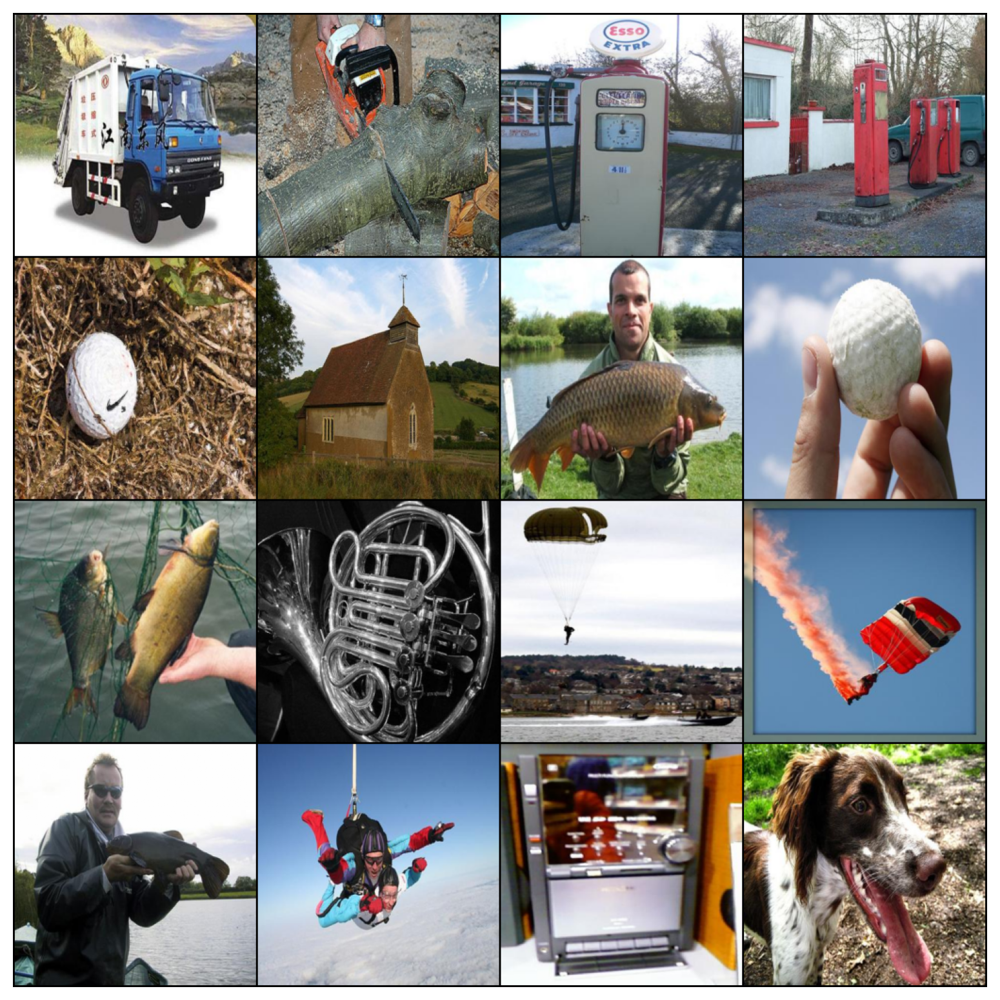

In [ ]:
# To preserve reproducibility
g_seed = torch.Generator()
g_seed.manual_seed(SEED)

imagenette_train_loader = torch.utils.data.DataLoader(imagenette_train_subset,
                                                      batch_size=16,
                                                      shuffle=True,
                                                      num_workers=2,
                                                      worker_init_fn=seed_worker,
                                                      generator=g_seed
                                                      )

imagenette_val_loader = torch.utils.data.DataLoader(imagenette_val,
                                                    batch_size=16,
                                                    shuffle=False,
                                                    num_workers=2,
                                                    worker_init_fn=seed_worker,
                                                    generator=g_seed)

dataiter = iter(imagenette_val_loader)
images, labels = next(dataiter)

# Show images
plt.figure(figsize=(8, 8))
plt.imshow(make_grid(images, nrow=4).permute(1, 2, 0))
plt.axis('off')
plt.show()

In [ ]:
# @title eval_imagenette function
def eval_imagenette(resnet, data_loader, dataset_length, device):
  resnet.eval()
  with torch.no_grad():
    loss_sum = 0
    total_1_correct = 0
    total_5_correct = 0
    total = dataset_length
    for batch in tqdm.tqdm(data_loader):
      images, labels = batch

      # Map the imagenette labels onto the network's output
      for i, label in enumerate(labels):
          labels[i] = dir_index_to_imagenet_label[label.item()]

      images = images.to(device)
      labels = labels.to(device)
      output = resnet(images)

      # Calculate top-5 accuracy
      # Implementation from https://github.com/bearpaw/pytorch-classification/blob/cc9106d598ff1fe375cc030873ceacfea0499d77/utils/eval.py
      batch_size = labels.size(0)

      _, predictions = output.topk(5, 1, True, True)
      predictions = predictions.t()

      top_k_correct = predictions.eq(labels.view(1, -1).expand_as(predictions))
      top_k_correct = top_k_correct.sum()

      predictions = torch.argmax(output, dim=1)
      top_1_correct = torch.sum(predictions == labels)
      total_1_correct += top_1_correct
      total_5_correct += top_k_correct

    top_1_acc = total_1_correct / total
    top_5_acc = total_5_correct / total

    return top_1_acc, top_5_acc

In [ ]:
# @title Imagenette Train Loop

def imagenette_train_loop(model, optimizer, train_loader,
                          loss_fn, device):
  """
  Training loop for Imagenette

  Args:
    model: nn.module
      Untrained model
    optimizer: function
      Optimizer
    train_loader: torch.loader
      Training loader
    loss_fn: function
      Criterion
    device: string
      If available, GPU/CUDA. CPU otherwise

  Returns:
    model: nn.module
      Trained model
  """
  for epoch in tqdm.tqdm(range(5)):
    # Set model to use the imagenette classifier head
    model.train()
    # Train on a batch of images
    for imagenette_batch in train_loader:
      images, labels = imagenette_batch

      # Convert labels from imagenette indices to imagenet labels
      for i, label in enumerate(labels):
        labels[i] = dir_index_to_imagenet_label[label.item()]

      images = images.to(device)
      labels = labels.to(device)
      output = model(images)
      optimizer.zero_grad()
      loss = loss_fn(output, labels)
      loss.backward()
      optimizer.step()

  return model

This cell creates a ResNet model pretrained on [ImageNet](http://www.image-net.org/), a 1000 class image prediction dataset. The model is then trained to make predictions on [Imagenette](https://github.com/fastai/imagenette), a small subset of ImageNet classes that is useful for demonstrations and prototyping.

In [ ]:

# Original network
top_1_accuracies = []
top_5_accuracies = []

# Instantiate a pretrained resnet model
set_seed(seed=SEED)
resnet = torchvision.models.resnet18(weights='ResNet18_Weights.DEFAULT').to(DEVICE)
resnet_opt = torch.optim.Adam(resnet.parameters(), lr=1e-4)
loss_fn = nn.CrossEntropyLoss()

imagenette_train_loop(resnet,
                      resnet_opt,
                      imagenette_train_loader,
                      loss_fn,
                      device=DEVICE)

top_1_acc, top_5_acc = eval_imagenette(resnet,
                                       imagenette_val_loader,
                                       len(imagenette_val),
                                       device=DEVICE)
top_1_accuracies.append(top_1_acc.item())
top_5_accuracies.append(top_5_acc.item())


Random seed 0 has been set.


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 163MB/s]
100%|██████████| 25/25 [00:00<00:00, 26.24it/s]


### Use the ResNet model

The function below runs a batch of images through the trained ResNet and returns the Top 5 class predictions and their probabilities. Note that the ResNet model returns unnormalized logits$^\dagger$. To obtain probabilities, you need to normalize the logits using softmax.

<br>

$^\dagger$ $ \text{logit}(p) = \sigma^{-1}(p) = \text{log} \left( \frac{p}{1-p} \right), \, \text{for} \, p \in (0,1)$, where $\sigma(\cdot)$ is the sigmoid function, i.e., $\sigma(z) = 1/(1+e^{-z})$. For more information see [here](http://machinelearningmechanic.com/deep_learning/2019/09/04/cross-entropy-loss-derivative.html).

In [ ]:

def predict_top5(images, device, seed):
  """
  Function to predict top 5 classes

  Args:
    images: torch.tensor
      Image data with dimensionality B x C x H x W batch size x number of channels x height x width)
    device: STRING
      `cuda` if GPU is available, else `cpu`.

  Output:
    top5_probs: torch.tensor
      Tensor(B, 5) with top 5 class probabilities
    top5_names: list
      List of top 5 class names (B, 5)
  """
  set_seed(seed=seed)

  B = images.size(0)
  with torch.no_grad():
    # Run images through model
    images = images.to(device)
    output = resnet(images)
    # The model output is unnormalized. To get probabilities, run a softmax on it.
    probs = torch.nn.functional.softmax(output, dim=1)
    # Fetch output from GPU and convert to numpy array
    probs = probs.cpu().numpy()

  # Get top 5 predictions
  _, top5_idcs = output.topk(5, 1, True, True)
  top5_idcs = top5_idcs.t().cpu().numpy()
  top5_probs = probs[torch.arange(B), top5_idcs]

  # Convert indices to class names
  top5_names = []
  for b in range(B):
    temp = [dict_map[key].split(',')[0] for key in top5_idcs[:, b]]
    top5_names.append(temp)

  return top5_names, top5_probs


# Get batch of images
dataiter = iter(imagenette_val_loader)
images, labels = next(dataiter)

## Test your function and retrieve top 5 predictions
top5_names, top5_probs = predict_top5(images, DEVICE, SEED)
print(top5_names[1])

Random seed 0 has been set.
['chain saw', 'power drill', 'parachute', 'lawn mower', 'shovel']


In [ ]:

top5_probs[:,0]

array([9.9999034e-01, 2.9207181e-06, 1.2676406e-06, 1.0279442e-06,
       7.7319618e-07], dtype=float32)

In [ ]:

top5_names[0]

['garbage truck', 'moving van', 'crane', 'police van', 'fire engine']

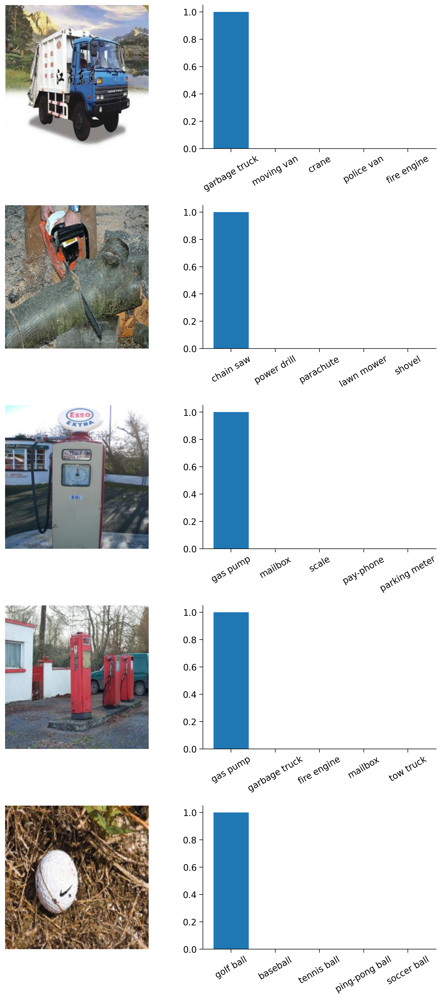

In [ ]:
# Visualize probabilities of top 5 predictions
fig, ax = plt.subplots(5, 2, figsize=(10, 20))

for i in range(5):
  ax[i, 0].imshow(np.moveaxis(images[i].numpy(), 0, -1))
  ax[i, 0].axis('off')

  ax[i, 1].bar(np.arange(5), top5_probs[:, i])
  ax[i, 1].set_xticks(np.arange(5))
  ax[i, 1].set_xticklabels(top5_names[i], rotation=30)

fig.tight_layout()
plt.show()

### Out-of-distribution examples

The code below runs two out-of-distribution examples through the trained ResNet. Look at the predictions and discuss, why the model might fail to make accurate predictions on these images.

In [ ]:
loc = 'https://raw.githubusercontent.com/NeuromatchAcademy/course-content-dl/main/tutorials/W2D3_ModernConvnets/static/'

fname1 = 'bonsai-svg-5.png'
response = requests.get(loc + fname1)
image = Image.open(BytesIO(response.content)).resize((256, 256))
data = torch.from_numpy(np.asarray(image)[:, :, :3]) / 255.

fname2 = 'Pokémon_Pikachu_art.png'
response = requests.get(loc + fname2)
image = Image.open(BytesIO(response.content)).resize((256, 256))
data2 = torch.from_numpy(np.asarray(image)[:, :, :3]) / 255.

images = torch.stack([data, data2]).permute(0, 3, 1, 2)

<ipython-input-52-8056983f8bf1>:6: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  data = torch.from_numpy(np.asarray(image)[:, :, :3]) / 255.


In [ ]:
# Retrieve top 5 predictions
top5_names, top5_probs = predict_top5(images, DEVICE, SEED)

Random seed 0 has been set.


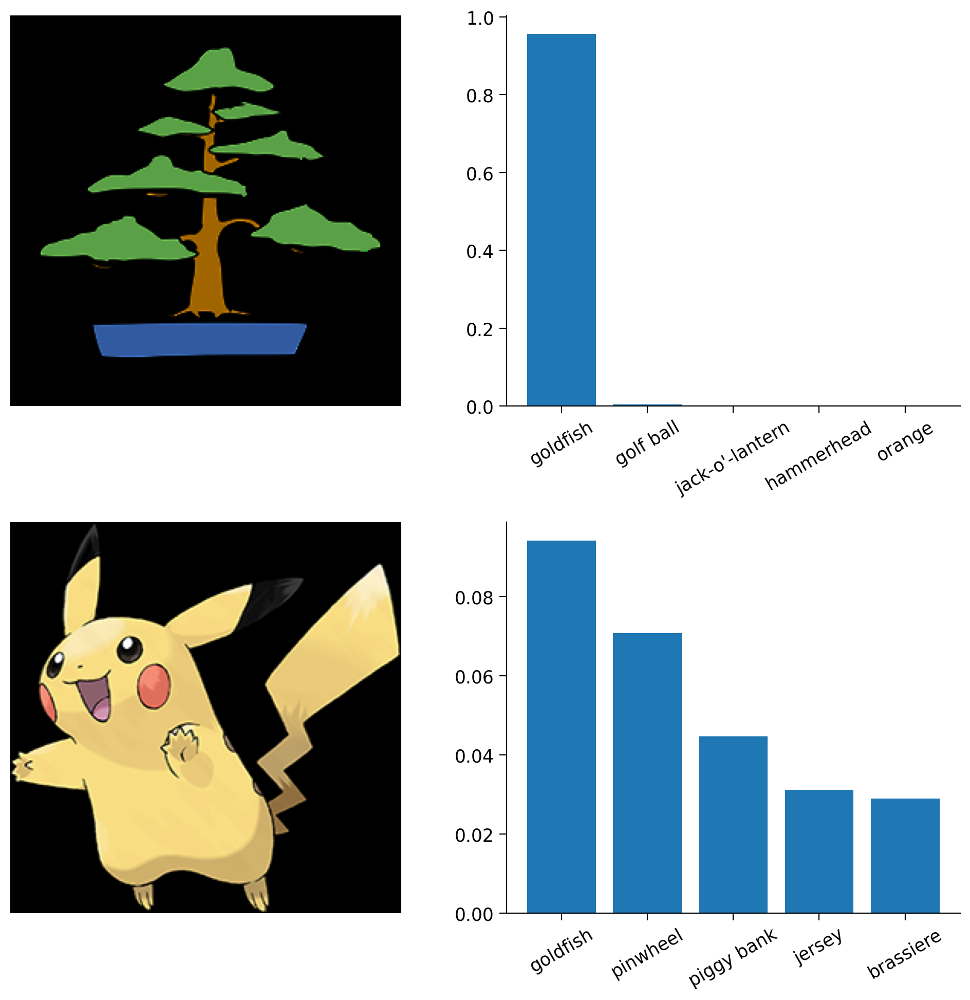

In [ ]:
# Visualize probabilities of top 5 predictions
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

for i in range(2):
  ax[i, 0].imshow(np.moveaxis(images[i].numpy(), 0, -1))
  ax[i, 0].axis('off')

  ax[i, 1].bar(np.arange(5), top5_probs[:, i])
  ax[i, 1].set_xticks(np.arange(5))
  ax[i, 1].set_xticklabels(top5_names[i], rotation=30)

fig.tight_layout()
plt.show()

# Question 5

What conclusion can you make based on the results shown above?